# A Multiplicative DRW Model for GRB Data

GRBs have strong variability that's hard to model. It also looks like for at least some GRBs, the variability amplitude is time-dependent, and seems to coincide at least somewhat with the overall rise and fall of the burst.

Let's start there: I want to build a model where I have an overall rise and fall of the burst, and on top of that a stochastic process that modulates this light curve.


In [39]:
%matplotlib notebook
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")
import arviz as az

import numpy as np
import scipy.io
import time as tsys

# Need both Jax and Tensorflow Probability 
import jax
# Important to enable 64-bit precision
jax.config.update("jax_enable_x64", True)

import jax.numpy as jnp
from jax import random
import tensorflow_probability.substrates.jax as tfp

# TinyGP for Gaussian Processes, JaxNS and numpyro for sampling
from tinygp import GaussianProcess, kernels
from tinygp.kernels.quasisep import CARMA
import corner

from jaxns.utils import resample
import numpyro
import numpyro.distributions as dist
from numpyro.infer.autoguide import AutoNormal, AutoIAFNormal
import numpyro.infer.autoguide as autoguide
from numpyro.infer import init_to_value

#stingray imports
import stingray
from stingray import Lightcurve, Powerspectrum
from stingray.modeling.gpmodeling import get_kernel, get_mean
from stingray.modeling.gpmodeling import get_prior, get_log_likelihood, get_gp_params
from stingray.modeling.gpmodeling import _skew_gaussian

# suppress warnings
import warnings
warnings.filterwarnings("ignore")

# abbreviations for tensorflow distributions + bijectors
tfpd = tfp.distributions
tfpb = tfp.bijectors


## Latent GP Model with Squared Exponential kernel + Numpyro, No Mean function

Let's generate the simplest case I can think of: a GP model with variability drawn from a Squared Exp kernel, without a mean function, where the data is the exponential of the GP realization, with Poisson noise added. 

This will also help me explore if we can brute-force a Poisson likelihood by just considering the underlying fluxes random variables in themselves, and then integrate over them when we do our inference:

INFO[2024-03-29 11:12:15,348]: Checking if light curve is well behaved. This can take time, so if you are sure it is already sorted, specify skip_checks=True at light curve creation.
INFO[2024-03-29 11:12:15,349]: Checking if light curve is sorted.
INFO[2024-03-29 11:12:15,349]: Computing the bin time ``dt``. This can take time. If you know the bin time, please specify it at light curve creation


<IPython.core.display.Javascript object>


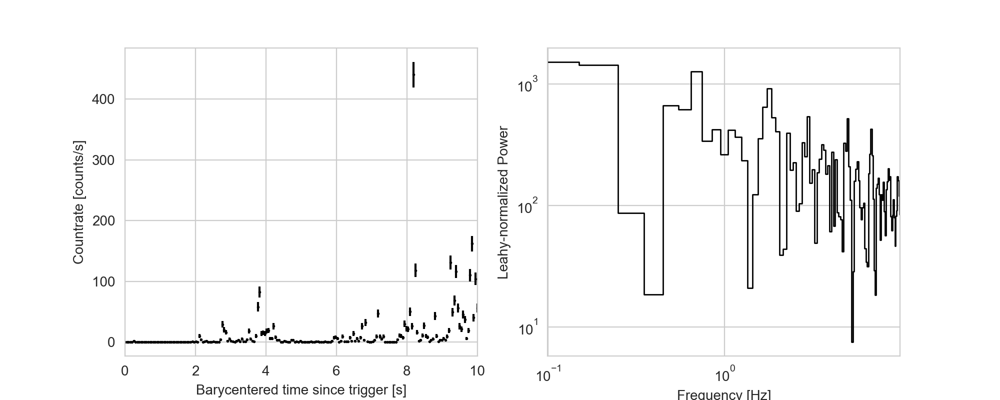

Text(0, 0.5, 'Leahy-normalized Power')

In [6]:
# set up time array
tseg = 10.0
time = np.linspace(0, tseg, int(tseg/0.05))

# no constant background for now
true_mean = jnp.zeros_like(time)

# set up GP kernel and GP
true_sigma = 3.0
true_scale = 0.5

kernel_params_true = {"sigma": true_sigma,
                      "scale": true_scale}


kernel = kernels.quasisep.Exp(
    scale=true_scale, sigma=true_sigma
)

gp = GaussianProcess(kernel, time, diag=0.01)

# random key for reproducibility
key = random.PRNGKey(200)

# exponentiate GP
sample = np.exp(gp.sample(key))
# include Poisson uncertainties
counts = np.random.poisson(sample)


# stick into Lightcurve objecs and make periodogram
lcsample = Lightcurve(time, counts)
pssample = Powerspectrum(lcsample, norm="leahy")

# plot light curve and PSD
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4))

ax1.errorbar(lcsample.time, lcsample.counts, yerr=np.sqrt(np.abs(lcsample.counts)), 
             fmt="o", markersize=1, color="black")
ax1.set_xlim(lcsample.time[0], lcsample.time[-1])
ax1.set_xlabel("Barycentered time since trigger [s]")
ax1.set_ylabel("Countrate [counts/s]")

ax2.loglog(pssample.freq, pssample.power, ds="steps-mid", lw=1, color="black")
ax2.set_xlim(pssample.freq[0], pssample.freq[-1])
ax2.set_xlabel("Frequency [Hz]")
ax2.set_ylabel("Leahy-normalized Power")



Now we can define the model:

In [7]:
def no_mean_mult_model(x, y=None):
    """
    A model that defines a Damped Random Walk Gaussian Process, 
    and models the data as the exponential of that DRW process, 
    including Poisson uncertainties.
    
    Parameters
    ----------
    x : jax.numpy.array
        The x-coordinate of the data (usually here time)
        
    y : jax.numpy.array
        The y-coordinate of the data (usually here photon counts)
    
    """
 
    # The parameters of the GP model    
    log_scale = numpyro.sample("log_scale", dist.Uniform(-10, 10))
    log_sigma = numpyro.sample("log_sigma", dist.Uniform(-2, 4))
    
    #print(alpha1)
    # Set up the kernel and GP objects
    
    kernel = kernels.quasisep.Exp(
        scale=jnp.exp(log_scale), sigma=jnp.exp(log_sigma)
    )

    gp = GaussianProcess(kernel, x, diag=0.01)

    # This parameter has shape (num_data,) and it encodes our beliefs about
    # the process rate in each bin
    log_rate = numpyro.sample("log_rate", gp.numpyro_dist())

    # Finally, our observation model is Poisson
    numpyro.sample("obs", dist.Poisson(jnp.exp(log_rate)), obs=y)


Now we can run MCMC and SVI on this to estimate the posterior, and compare results. I'm running both on everything because I want to compare the computational performance and how well it recovers posteriors:

In [15]:
timer_start = tsys.time()
## MCMC 
nuts_kernel = numpyro.infer.NUTS(no_mean_mult_model, target_accept_prob=0.9)
mcmc = numpyro.infer.MCMC(
    nuts_kernel,
    num_warmup=1000,
    num_samples=1000,
    num_chains=2,
    progress_bar=True,
)
rng_key = jax.random.PRNGKey(55873)
mcmc.run(rng_key, lcsample.time, y=lcsample.counts)
mcmc_samples = mcmc.get_samples()

timer_end = tsys.time()
print(f"Total run time: {timer_end - timer_start}")

sample: 100%|█| 2000/2000 [00:10<00:00, 188.45it/s, 31 steps of size 1.04e-01. a
sample: 100%|█| 2000/2000 [00:07<00:00, 251.51it/s, 31 steps of size 1.17e-01. a

Total run time: 19.620168924331665


<IPython.core.display.Javascript object>


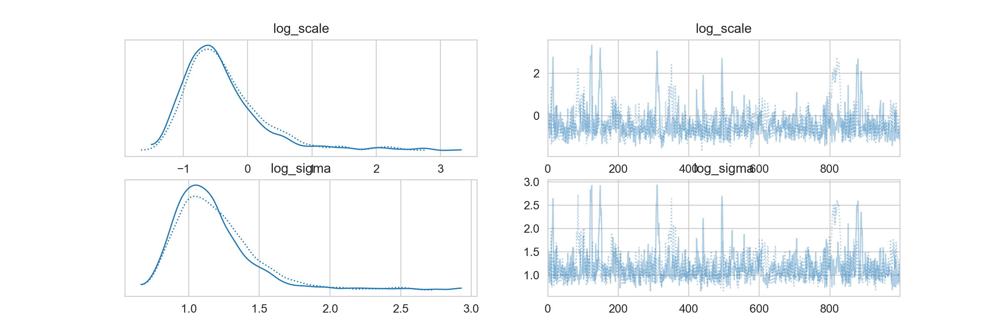

In [16]:
truths = [("log_scale", np.log(true_scale)), ("log_sigma", np.log(true_sigma))]

mcmc_data = az.from_numpyro(mcmc)
az.plot_trace(mcmc_data, compact=True, lines=truths, var_names=["log_scale", "log_sigma"]);

Let's do SVI next:

In [20]:
timer_start = tsys.time()

# SVI
optim = numpyro.optim.Adam(0.01)
guide = autoguide.AutoMultivariateNormal(no_mean_mult_model)
#guide = AutoIAFNormal(const_mean_mult_model)
svi = numpyro.infer.SVI(no_mean_mult_model, guide, optim, numpyro.infer.Trace_ELBO(10))

nsteps = 1000
results = svi.run(jax.random.PRNGKey(55873), nsteps, lcsample.time, y=lcsample.counts, progress_bar=True)

timer_end = tsys.time()
print(f"Total run time: {timer_end - timer_start}")

100%|█| 1000/1000 [00:05<00:00, 191.61it/s, init loss: 9949.8925, avg. loss [951


Total run time: 5.786056041717529


<IPython.core.display.Javascript object>


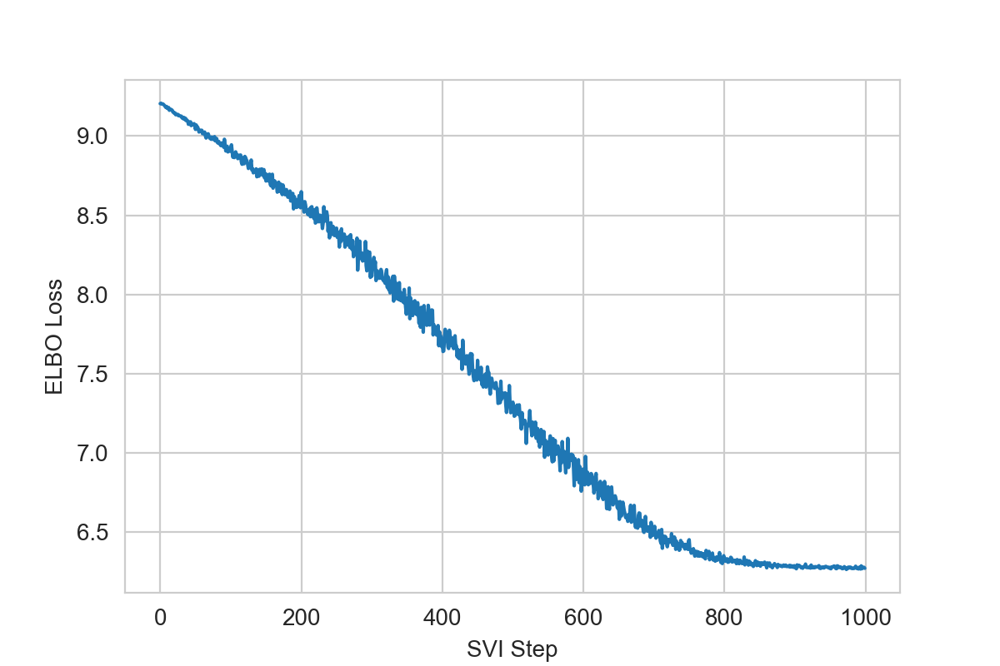

Text(0, 0.5, 'ELBO Loss')

In [21]:
fig, ax = plt.subplots(1, 1, figsize=(6,4))

ax.plot(np.arange(nsteps), np.log(results.losses))
ax.set_xlabel("SVI Step")
ax.set_ylabel("ELBO Loss")



In [22]:
svi_samples = guide.sample_posterior(key, results.params, sample_shape=(1000,))

<IPython.core.display.Javascript object>


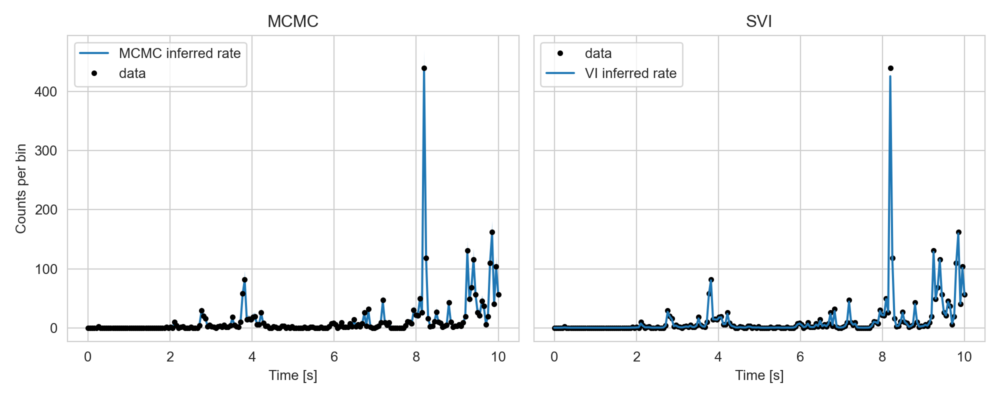

In [29]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), sharey=True, sharex=True)

q = np.percentile(mcmc_samples["log_rate"], [5, 25, 50, 75, 95], axis=0)
ax1.plot(lcsample.time, np.exp(q[2]), color="C0", label="MCMC inferred rate")
ax1.fill_between(lcsample.time, np.exp(q[0]), np.exp(q[-1]), alpha=0.3, lw=0, color="C0")
ax1.fill_between(lcsample.time, np.exp(q[1]), np.exp(q[-2]), alpha=0.3, lw=0, color="C0")
#plt.plot(x, , "--", color="C1", label="true rate")
ax1.plot(lcsample.time, lcsample.counts, ".k", label="data")
ax1.legend(loc=2)
ax1.set_xlabel("Time [s]")
ax1.set_ylabel("Counts per bin")
ax1.set_title("MCMC")


mu = results.params["auto_loc"][2:]
sigma = np.diag(results.params["auto_scale_tril"][2:])

ax2.plot(lcsample.time, lcsample.counts, ".k", label="data")

ax2.plot(lcsample.time, np.exp(mu), color="C0", label="VI inferred rate")
ax2.fill_between(
    lcsample.time,
    np.exp(mu - 2 * sigma),
    np.exp(mu + 2 * sigma),
    alpha=0.3,
    lw=0,
    color="C0",
)
ax2.fill_between(lcsample.time, np.exp(mu - sigma), np.exp(mu + sigma), alpha=0.8, lw=0, color="C0")
#plt.plot(time[:npoints], np.exp(true_log_rate), "--", color="C1", label="true rate")
ax2.legend(loc=2)
ax2.set_xlabel("Time [s]")
ax2.set_title("SVI")
fig.tight_layout()


What do the corner plots look like?

Black corresponds to MCMC, green to SVI. 

<IPython.core.display.Javascript object>


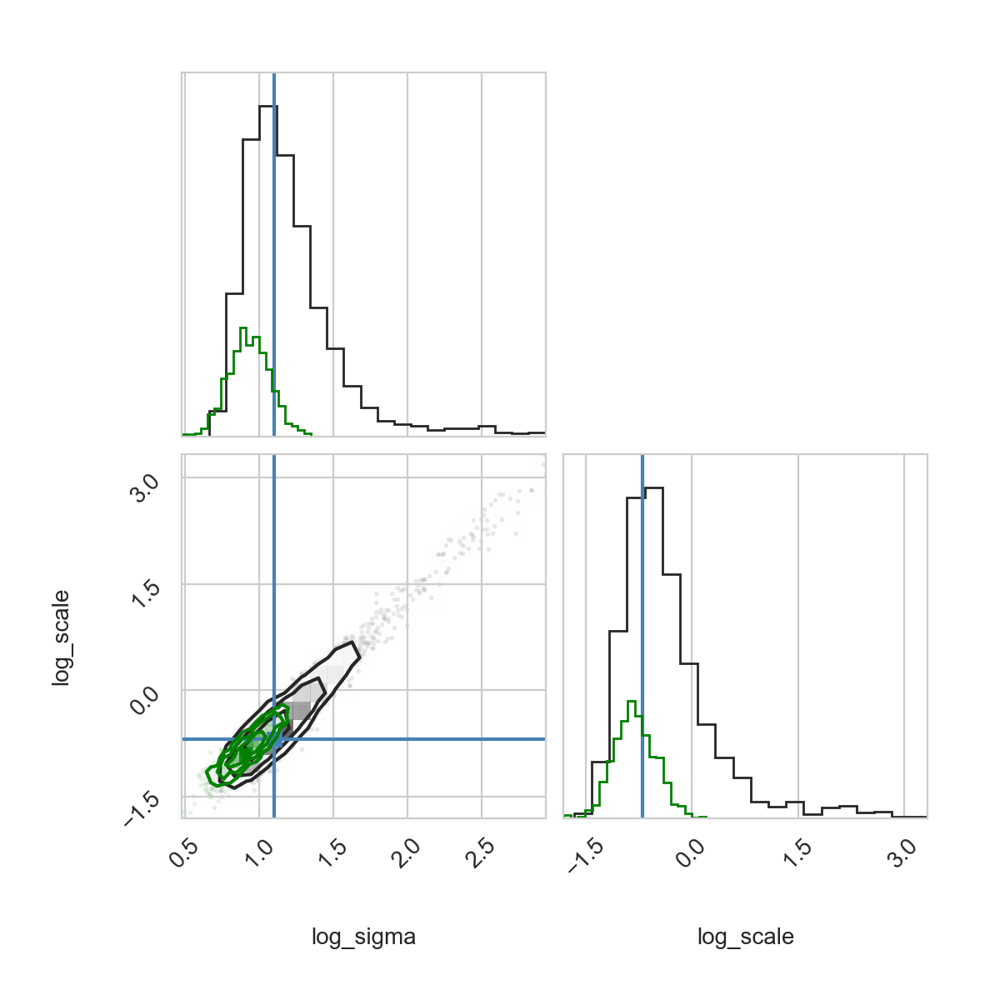

In [32]:
var_names = ["log_sigma", "log_scale"]
true_params = {"log_sigma": jnp.log(true_sigma), "log_scale": jnp.log(true_scale)}

samples_pars = np.array([svi_samples[vn] for vn in var_names]).T
mcmc_samples_pars = np.array([mcmc_samples[vn] for vn in var_names]).T
true_params_list = np.array([true_params[vn] for vn in var_names])


fig = plt.figure(figsize=(6, 6))
corner.corner(mcmc_samples_pars, truths=true_params_list, labels=var_names, fig=fig, titles="MCMC");
corner.corner(samples_pars, fig=fig, color="green");

I think SVI might be overconfident with its predictions? Maybe because it uses a Multivariate normal as the guide, which I think enforces posteriors to be Gaussian.

## Adding an additive, constant mean function.

Let's now add a parameter, but it's going to be very simple: just a constant mean corresponding to some sky background:

INFO[2024-03-29 11:26:46,756]: Checking if light curve is well behaved. This can take time, so if you are sure it is already sorted, specify skip_checks=True at light curve creation.
INFO[2024-03-29 11:26:46,756]: Checking if light curve is sorted.
INFO[2024-03-29 11:26:46,757]: Computing the bin time ``dt``. This can take time. If you know the bin time, please specify it at light curve creation


<IPython.core.display.Javascript object>


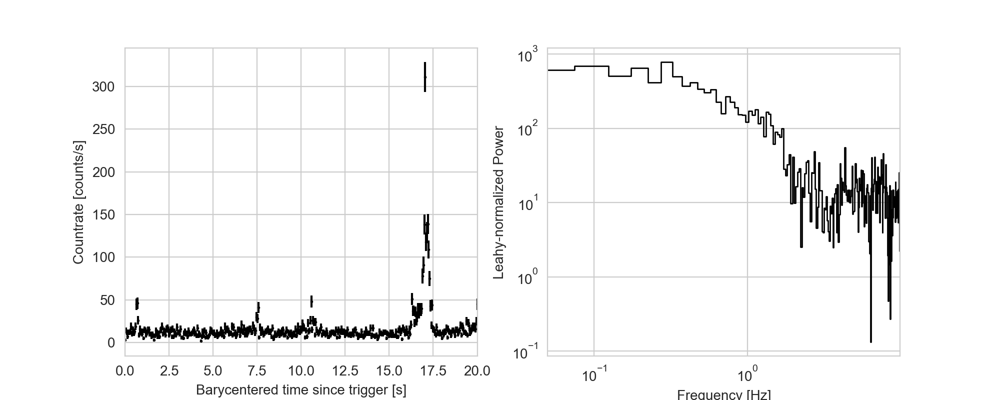

Text(0, 0.5, 'Leahy-normalized Power')

In [35]:
# set up time array
tseg = 20.0
time = np.linspace(0, tseg, int(tseg/0.05))

# set up constant background
true_bkg = 10.0
mean = jnp.zeros_like(time) + true_bkg


# set up GP kernel and GP
true_sigma = 2.0
true_scale = 1.0

kernel_params_true = {"sigma": true_sigma,
                      "scale": true_scale}


kernel = kernels.quasisep.Exp(
    scale=true_scale, sigma=true_sigma
)

gp = GaussianProcess(kernel, time, diag=0.01)

# random key for reproducibility
key = random.PRNGKey(500)

# exponentiate GP and add constant mean
sample = np.exp(gp.sample(key)) + mean

# include Poisson uncertainties
counts = np.random.poisson(sample)

# save in light curve and periodogram objects
lcsample = Lightcurve(time, counts)
pssample = Powerspectrum(lcsample, norm="leahy")

# plot simulated light curve
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4))

ax1.errorbar(lcsample.time, lcsample.counts, yerr=np.sqrt(np.abs(lcsample.counts)), 
             fmt="o", markersize=1, color="black")
ax1.set_xlim(lcsample.time[0], lcsample.time[-1])
ax1.set_xlabel("Barycentered time since trigger [s]")
ax1.set_ylabel("Countrate [counts/s]")

ax2.loglog(pssample.freq, pssample.power, ds="steps-mid", lw=1, color="black")
ax2.set_xlim(pssample.freq[0], pssample.freq[-1])
ax2.set_xlabel("Frequency [Hz]")
ax2.set_ylabel("Leahy-normalized Power")


Now we can build the model: similar to the previous one, just with a background parameter:

In [36]:
def const_mean_mult_model(x, y=None):
    """
    A model that defines a Damped Random Walk Gaussian Process, 
    and models the data as the exponential of that DRW process, 
    including Poisson uncertainties.
    
    Parameters
    ----------
    x : jax.numpy.array
        The x-coordinate of the data (usually here time)
        
    y : jax.numpy.array
        The y-coordinate of the data (usually here photon counts)
    
    """
 
    # The parameters of the GP model    
    log_scale = numpyro.sample("log_scale", dist.Uniform(-10, 10))
    log_sigma = numpyro.sample("log_sigma", dist.Uniform(-2, 4))
    log_bkg = numpyro.sample("log_bkg", dist.Uniform(-2, 5))
    
    #print(alpha1)
    # Set up the kernel and GP objects
    
    kernel = kernels.quasisep.Exp(
        scale=jnp.exp(log_scale), sigma=jnp.exp(log_sigma)
    )

    gp = GaussianProcess(kernel, x, diag=0.01)

    # This parameter has shape (num_data,) and it encodes our beliefs about
    # the process rate in each bin
    log_rate = numpyro.sample("log_rate", gp.numpyro_dist())
    
    flux = jnp.exp(log_rate) + jnp.exp(log_bkg)

    # Finally, our observation model is Poisson
    numpyro.sample("obs", dist.Poisson(flux), obs=y)


In [40]:
timer_start = tsys.time()

## MCMC 
nuts_kernel = numpyro.infer.NUTS(const_mean_mult_model, target_accept_prob=0.9)
mcmc = numpyro.infer.MCMC(
    nuts_kernel,
    num_warmup=1000,
    num_samples=1000,
    num_chains=2,
    progress_bar=True,
)
rng_key = jax.random.PRNGKey(59873)
mcmc.run(rng_key, lcsample.time, y=lcsample.counts)
mcmc_samples = mcmc.get_samples()

timer_end = tsys.time()
print(f"Total run time: {timer_end - timer_start}")

sample: 100%|█| 2000/2000 [00:19<00:00, 101.42it/s, 63 steps of size 8.03e-02. a
sample: 100%|█| 2000/2000 [00:21<00:00, 91.19it/s, 63 steps of size 5.52e-02. ac


Total run time: 45.28514504432678


<IPython.core.display.Javascript object>


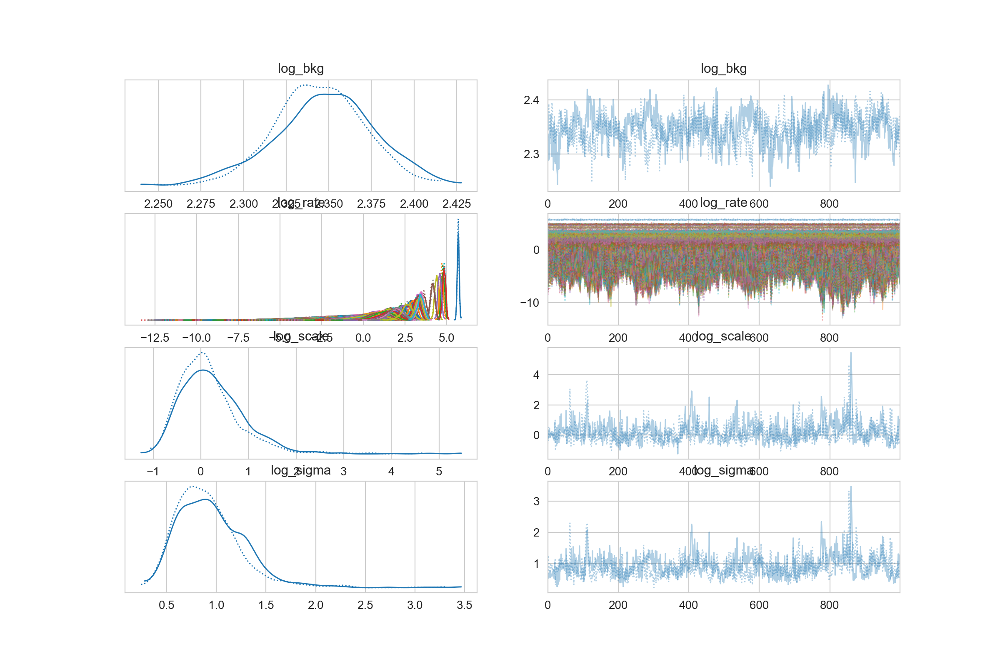

In [41]:
mcmc_data = az.from_numpyro(mcmc)
az.plot_trace(mcmc_data, compact=True);

In [60]:
timer_start = tsys.time()

# set up initial values for SVIL
init_values = {"log_sigma": 1.0, "log_scale":0.5, "log_bkg":3.0}

# SVI
optim = numpyro.optim.Adam(0.001)
#guide = autoguide.AutoMultivariateNormal(const_mean_mult_model)
guide = autoguide.AutoDAIS(const_mean_mult_model, init_loc_fn=init_to_value(values=init_values))
svi = numpyro.infer.SVI(const_mean_mult_model, guide, optim, numpyro.infer.Trace_ELBO(10))
nsteps = 5000
results = svi.run(jax.random.PRNGKey(55973), nsteps, time, y=sample, progress_bar=True)

svi_samples = guide.sample_posterior(key, results.params, sample_shape=(1000,))

timer_end = tsys.time()
print(f"Total run time: {timer_end - timer_start}")

100%|█| 5000/5000 [00:57<00:00, 87.26it/s, init loss: 4732.8150, avg. loss [4751


Total run time: 62.24288010597229


<IPython.core.display.Javascript object>


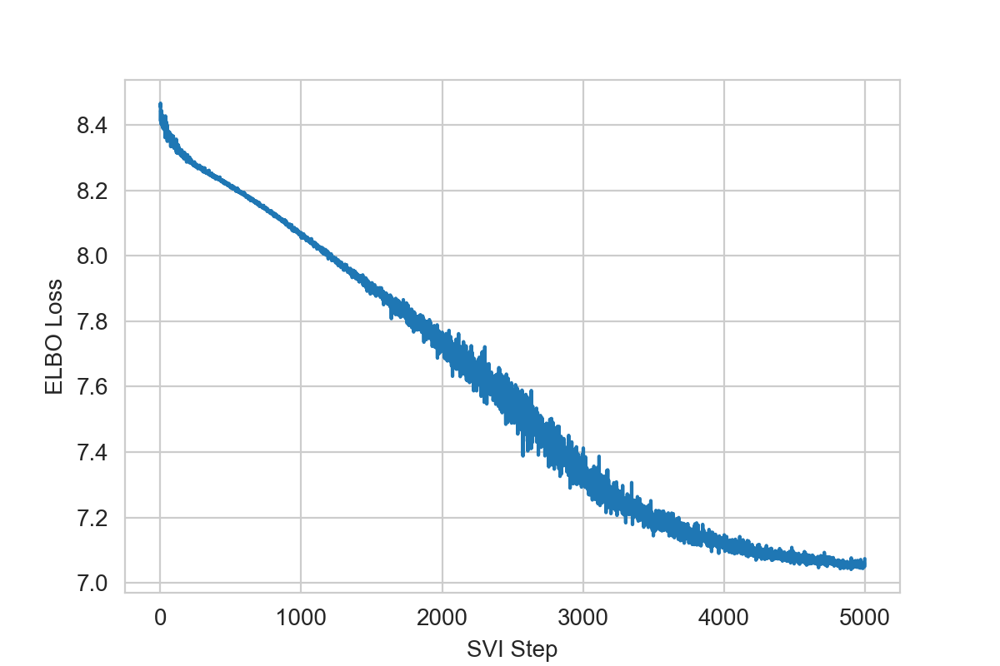

Text(0, 0.5, 'ELBO Loss')

In [61]:
fig, ax = plt.subplots(1, 1, figsize=(6,4))
ax.plot(np.arange(nsteps), np.log(results.losses))
ax.set_xlabel("SVI Step")
ax.set_ylabel("ELBO Loss")



Let's plot posterior predictives to see how well the model fits the data:

<IPython.core.display.Javascript object>


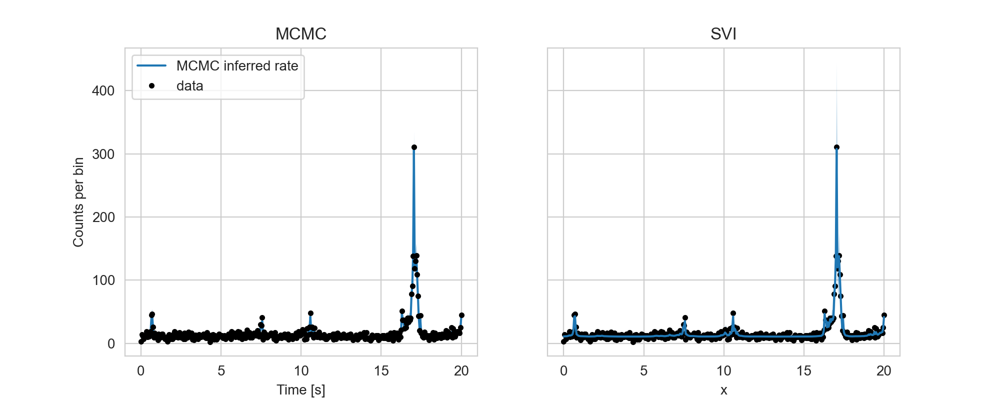

Text(0.5, 1.0, 'SVI')

In [63]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), sharey=True, sharex=True)

ax1.plot(lcsample.time, q[2] , color="C0", label="MCMC inferred rate")
ax1.fill_between(lcsample.time, q[0], q[-1], alpha=0.3, lw=0, color="C0")
ax1.fill_between(lcsample.time, q[1], q[-2], alpha=0.3, lw=0, color="C0")
#plt.plot(x, , "--", color="C1", label="true rate")
ax1.plot(lcsample.time, lcsample.counts, ".k", label="data")
ax1.legend(loc=2)
ax1.set_xlabel("Time [s]")
ax1.set_ylabel("Counts per bin")
ax1.set_title("MCMC")


svi_flux = jnp.exp(svi_samples["log_rate"]).T + jnp.exp(svi_samples["log_bkg"])
q_svi = np.percentile(svi_flux.T, [5, 25, 50, 75, 95], axis=0)

ax2.plot(lcsample.time, lcsample.counts, ".k", label="data")

ax2.plot(lcsample.time, q[2], color="C0", label="SVI inferred rate")
ax2.fill_between(lcsample.time, q_svi[0], q_svi[-1], alpha=0.3, lw=0, color="C0")
ax2.fill_between(lcsample.time, q_svi[1], q_svi[-2], alpha=0.3, lw=0, color="C0")

ax2.set_xlabel("x")
ax2.set_title("SVI")


Plot MCMC Results:

<IPython.core.display.Javascript object>


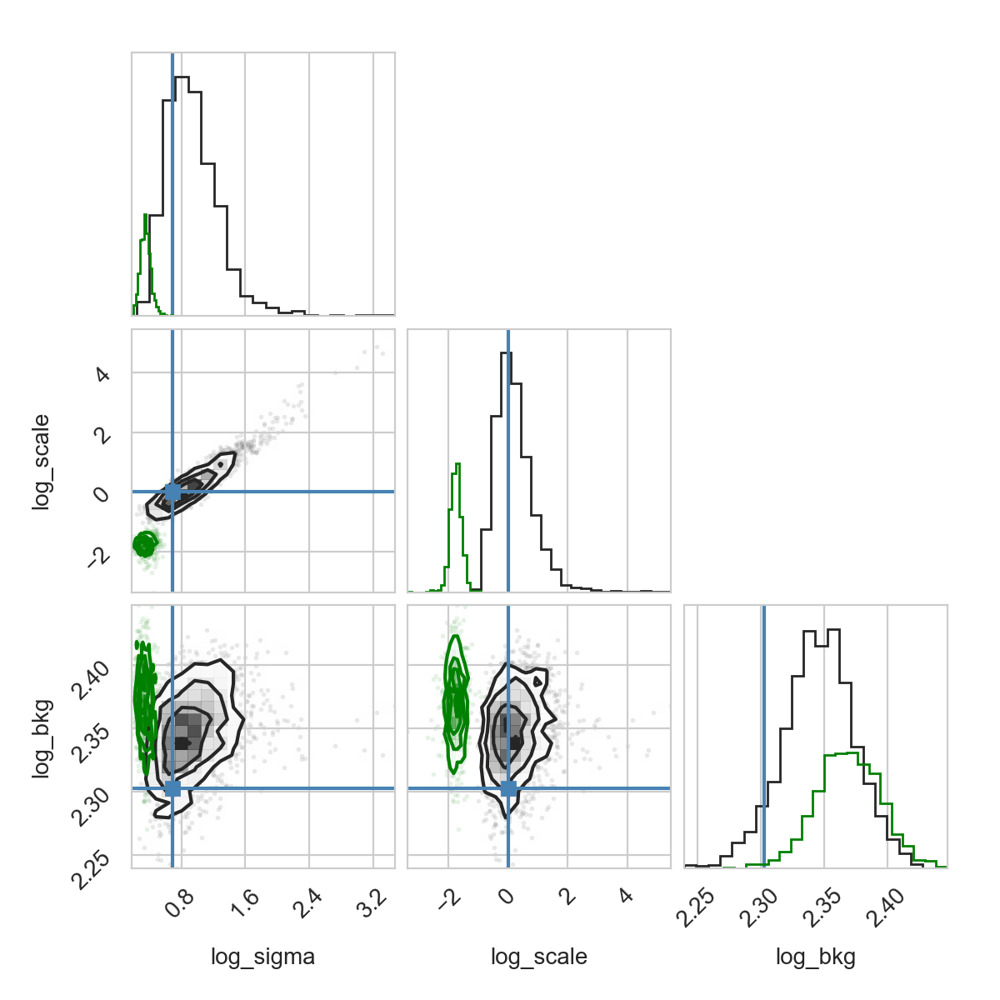

<IPython.core.display.Javascript object>


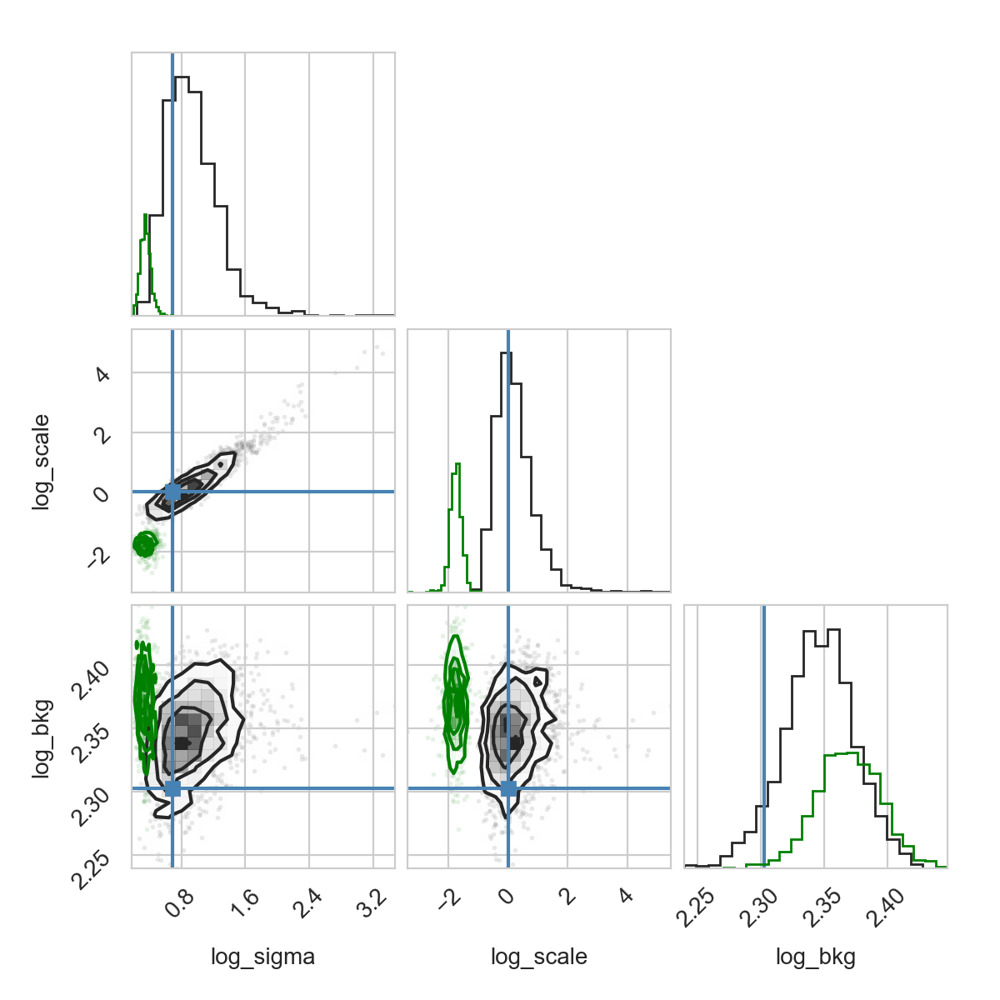

In [64]:
var_names = ["log_sigma", "log_scale", "log_bkg"]
true_params = {"log_sigma": jnp.log(true_sigma), "log_scale": jnp.log(true_scale),
               "log_bkg": jnp.log(true_bkg)}

samples_pars = np.array([svi_samples[vn] for vn in var_names]).T
mcmc_samples_pars = np.array([mcmc_samples[vn] for vn in var_names]).T
true_params_list = np.array([true_params[vn] for vn in var_names])


fig = plt.figure(figsize=(6, 6))
corner.corner(mcmc_samples_pars, truths=true_params_list, labels=var_names, fig=fig, titles="MCMC");
corner.corner(samples_pars, fig=fig, color="green");

The MCMC does well, but the SVI does not. Let's keep going and make sure I try out some more SVI stuff when I get to a place where I need it:

### Including an Additive Mean Function

Let's now include a additive mean function before we do the same with the multiplicative version. Here, I mean a more complex additive mean function than a constant. We'll use a skew-gaussian function for it, because it's nice and straightforward. I'm also going to switch to a Matern-3/2 kernel from the set of quasi-separable kernels in TinyGP for speed reasons, and because I think the ragged time series that kernel produces might be better. We'll get back to evaluating kernels later.

I'm also going to include one more subtlety: I'm going to add a constant to the GP-rate before exponentiating. This is because the GP by default is centred around zero, which means I have some very high peaks and areas of the light curve where the GP does nothing, because the exponential of -4 is zero. Not sure this is a good idea; let's circle back to that later, too:

In [72]:
def skewgaussian(t, params):
    """
    calculates a skew-Gaussian function at times `t` for a given 
    set of parameters stored in `params`.

    Parameters
    ----------
    t : numpy.ndarray or JAX array
        Set of time stamps at which to evaluate the 
        skew-Gaussian function
        
    params : iterable
        list of parameters for the skew-Gaussian. They are:
            * `logA`: log-amplitude (height)
            * `t0`: time of peak
            * `logsig1`: log of the rise timescale
            * `logsig2`: log of the fall timescale
    
    Returns
    -------
    y : numpy.ndarray or JAX array
        Array with skew-Gaussian evaluated at times `t`
    """
    logA = params[0]
    t0 = params[1]
    logsig1 = params[2]
    logsig2 = params[3]

    y = jnp.exp(logA) * jnp.where(
            t > t0,
            jnp.exp(-((t - t0) ** 2) / (2 * (jnp.exp(logsig2)**2))),
            jnp.exp(-((t - t0) ** 2) / (2 * (jnp.exp(logsig1)**2))),
        )
    return y

INFO[2024-03-29 11:50:58,666]: Checking if light curve is well behaved. This can take time, so if you are sure it is already sorted, specify skip_checks=True at light curve creation.
INFO[2024-03-29 11:50:58,667]: Checking if light curve is sorted.
INFO[2024-03-29 11:50:58,667]: Computing the bin time ``dt``. This can take time. If you know the bin time, please specify it at light curve creation


<IPython.core.display.Javascript object>


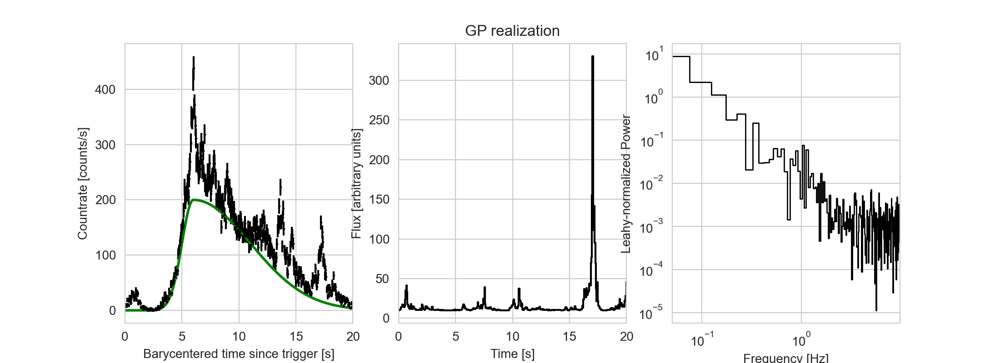

Text(0, 0.5, 'Leahy-normalized Power')

In [74]:
# Make a time array
dt = 0.05
tseg = 20.0
time = np.linspace(0, tseg, int(tseg/0.05))

# constant to add to the GP
# currently *NOT* part of the model
true_gp_const = 3.0
gp_mean = jnp.zeros_like(time) + true_gp_const

# set up GP kernel
true_sigma = 1.0
true_scale = 0.5

kernel_params_true = {"sigma": true_sigma,
                      "scale": true_scale}

kernel = kernels.quasisep.Matern32(scale=true_scale, sigma=true_sigma)

# GP without the mean function to generate random process
gp = GaussianProcess(kernel, time, mean_value=gp_mean, diag=0.01)

# generate GP realization
key = random.PRNGKey(120)
gp_sample = gp.sample(key)

# set up the mean function
skew_amp = 200
skew_t0 = 6.0
skew_sig1 = 1.0
skew_sig2 = 5.0

mean_params_true = [np.log(skew_amp),
               skew_t0,
               np.log(skew_sig1),
               np.log(skew_sig2),]

mean_val = skewgaussian(time, mean_params_true)


# calculate flux
exp_gp = jnp.exp(gp_sample) # exponentiated GP
flux = exp_gp + mean_val # flux is GP plus skew-gaussian
counts = np.random.poisson(flux) # add Poisson uncertainties

lcsample = Lightcurve(time, counts)
pssample = Powerspectrum(lcsample, norm="frac")

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(11,4))

ax1.errorbar(lcsample.time, lcsample.counts, yerr=np.sqrt(np.abs(lcsample.counts)), 
             fmt="o", markersize=1, color="black")
ax1.plot(time, mean_val, lw=2, color="green")

ax1.set_xlim(lcsample.time[0], lcsample.time[-1])
ax1.set_xlabel("Barycentered time since trigger [s]")
ax1.set_ylabel("Countrate [counts/s]")

ax2.plot(lcsample.time, sample, color="black", ds="steps-mid")
ax2.set_xlim(lcsample.time[0], lcsample.time[-1])
ax2.set_xlabel("Time [s]")
ax2.set_ylabel("Flux [arbitrary units]")
ax2.set_title("GP realization")

ax3.loglog(pssample.freq, pssample.power, ds="steps-mid", lw=1, color="black")
ax3.set_xlim(pssample.freq[0], pssample.freq[-1])
ax3.set_xlabel("Frequency [Hz]")
ax3.set_ylabel("Leahy-normalized Power")

Let's define a model that includes this mean function:

In [75]:
def add_mean_mult_model(x, y=None):
    """
    A model that defines a Gaussian Process with a Matern 3/2 kernel, 
    and a skew-Gaussian function, and models the light curve as 
    the linear sum of the two. 
    
    
    Parameters
    ----------
    x : jax.numpy.array
        The x-coordinate of the data (usually here time)
        
    y : jax.numpy.array
        The y-coordinate of the data (usually here photon counts)
    
    """
 
    # mean parameters
    log_amp = numpyro.sample('log_amp', dist.Uniform(3, 8))
    t0 = numpyro.sample("t0", dist.Uniform(2, 10))
    log_sig1 = numpyro.sample("log_sig1", dist.Uniform(-1, 1.5))
    log_sig2 = numpyro.sample("log_sig2", dist.Uniform(0, 3))

    # list of mean parameters
    mean_params = [log_amp, t0, log_sig1, log_sig2]
    
    # evaluate skew-Gaussian
    mean_val = skewgaussian(x, mean_params)
    

    # The parameters of the GP model    
    log_scale = numpyro.sample("log_scale", dist.Uniform(-2, 10))
    log_sigma = numpyro.sample("log_sigma", dist.Uniform(-2, 4))

    # Set up the kernel and GP objects    
    kernel = kernels.quasisep.Matern32(
        scale=jnp.exp(log_scale), sigma=jnp.exp(log_sigma)
    )

    gp = GaussianProcess(kernel, x, mean_value=gp_mean, diag=0.01)

    # This parameter has shape (num_data,) and it encodes our beliefs about
    # the process rate in each bin
    log_rate = numpyro.sample("log_rate", gp.numpyro_dist())
    
    flux = jnp.exp(log_rate + 3.0) + mean_val

    # Finally, our observation model is Poisson
    numpyro.sample("obs", dist.Poisson(flux), obs=y)


Sampling, first with MCMC, then with SVI:

In [76]:
timer_start = tsys.time()

## MCMC 
nuts_kernel = numpyro.infer.NUTS(add_mean_mult_model, target_accept_prob=0.9)
mcmc = numpyro.infer.MCMC(
    nuts_kernel,
    num_warmup=1000,
    num_samples=1000,
    num_chains=2,
    progress_bar=True,
)
rng_key = jax.random.PRNGKey(59889)
mcmc.run(rng_key, lcsample.time, y=lcsample.counts)
mcmc_samples = mcmc.get_samples()

timer_end = tsys.time()
print(f"Total run time: {timer_end - timer_start}")

sample: 100%|█| 2000/2000 [00:50<00:00, 39.92it/s, 63 steps of size 3.94e-02. ac
sample: 100%|█| 2000/2000 [00:56<00:00, 35.44it/s, 127 steps of size 2.55e-02. a

Total run time: 111.73584604263306


<IPython.core.display.Javascript object>


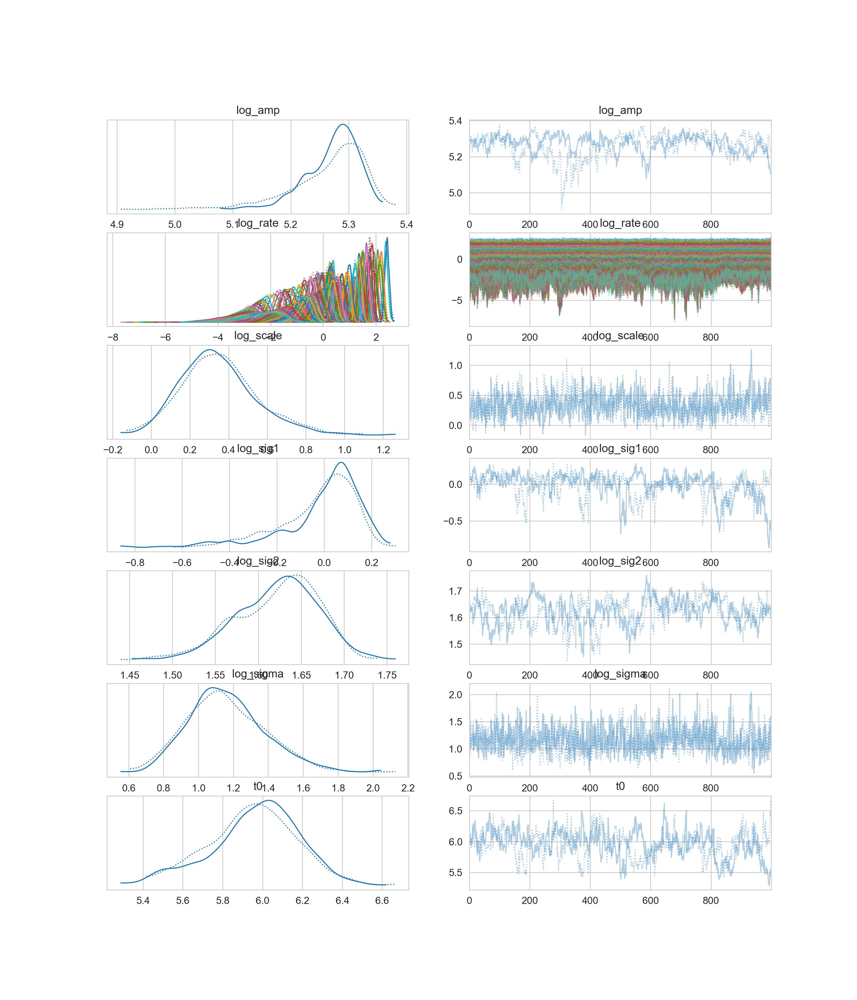

In [77]:
mcmc_data = az.from_numpyro(mcmc)
az.plot_trace(mcmc_data, compact=True);

SVI, this time with initialization from relatively close values:

In [78]:
init_values = {"log_amp": 5.0, "t0":5.0, "log_sig1":0.0, "log_sig2": 2.0,
               "log_sigma": 1.0, "log_scale":0.5}

In [79]:
timer_start = tsys.time()

# SVI
optim = numpyro.optim.Adam(0.001)
#guide = autoguide.AutoMultivariateNormal(add_mean_mult_model)
guide = autoguide.AutoDAIS(add_mean_mult_model, init_loc_fn=init_to_value(values=init_values))
svi = numpyro.infer.SVI(add_mean_mult_model, guide, optim, numpyro.infer.Trace_ELBO(10))

nsteps = 10000
results = svi.run(jax.random.PRNGKey(55873), nsteps, lcsample.time, y=lcsample.counts, progress_bar=True)

svi_samples = guide.sample_posterior(key, results.params, sample_shape=(1000,))

timer_end = tsys.time()
print(f"Total run time: {timer_end - timer_start}")

100%|█| 10000/10000 [04:10<00:00, 39.90it/s, init loss: 19633.0482, avg. loss [9


Total run time: 256.4584400653839


Plotting the loss function:

<IPython.core.display.Javascript object>


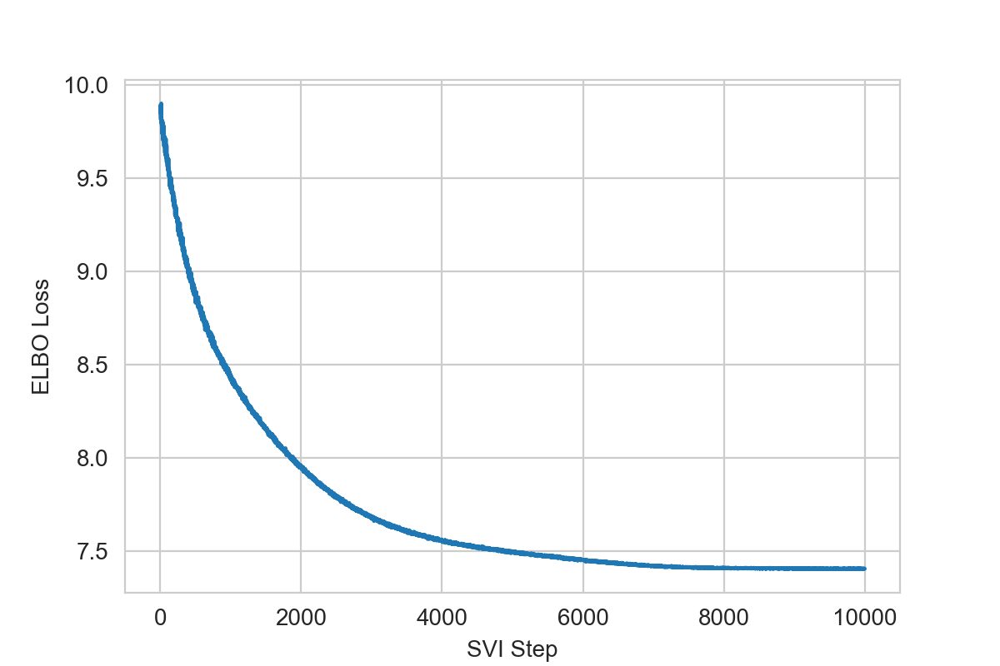

Text(0, 0.5, 'ELBO Loss')

In [80]:
fig, ax = plt.subplots(1, 1, figsize=(6,4))
ax.plot(np.arange(nsteps), np.log(results.losses))
ax.set_xlabel("SVI Step")
ax.set_ylabel("ELBO Loss")

What do the results look like?

In [81]:
mcmc_skew_params = np.array([mcmc_samples["log_amp"], mcmc_samples["t0"], 
                    mcmc_samples["log_sig1"], mcmc_samples["log_sig2"]]).T

mcmc_mean = []
for p in mcmc_skew_params:
    mcmc_mean.append(skewgaussian(lcsample.time,p))

mcmc_mean = np.array(mcmc_mean)


svi_skew_params = np.array([svi_samples["log_amp"], svi_samples["t0"], 
                            svi_samples["log_sig1"], svi_samples["log_sig2"]]).T

svi_mean = []
for p in svi_skew_params:
    svi_mean.append(skewgaussian(lcsample.time,p))

svi_mean = np.array(svi_mean)

<IPython.core.display.Javascript object>


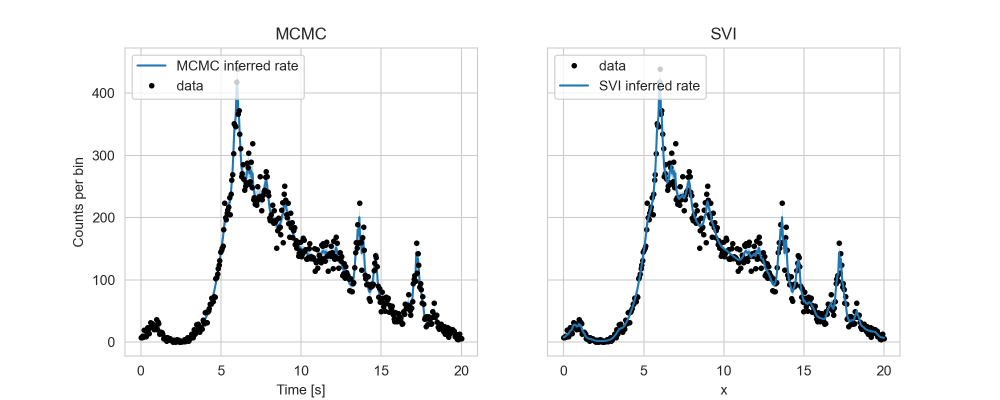

Text(0.5, 1.0, 'SVI')

In [82]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), sharey=True, sharex=True)

mcmc_flux = jnp.exp(mcmc_samples["log_rate"] + 3.0).T + mcmc_mean.T
q = np.percentile(mcmc_flux.T, [5, 25, 50, 75, 95], axis=0)
ax1.plot(lcsample.time, q[2] , color="C0", label="MCMC inferred rate")
ax1.fill_between(lcsample.time, q[0], q[-1], alpha=0.3, lw=0, color="C0")
ax1.fill_between(lcsample.time, q[1], q[-2], alpha=0.3, lw=0, color="C0")
#plt.plot(x, , "--", color="C1", label="true rate")
ax1.plot(lcsample.time, lcsample.counts, ".k", label="data")
ax1.legend(loc=2)
ax1.set_xlabel("Time [s]")
ax1.set_ylabel("Counts per bin")
ax1.set_title("MCMC")



#mu = results.params["auto_z_0_loc"][6:] #results.params["log_rate_auto_loc"]
#sigma = results.params["auto_z_0_scale"][6:] # results.params["log_rate_auto_scale"]

svi_flux = jnp.exp(svi_samples["log_rate"]+ 3.0).T + svi_mean.T
q_svi = np.percentile(svi_flux.T, [5, 25, 50, 75, 95], axis=0)

ax2.plot(lcsample.time, lcsample.counts, ".k", label="data")


ax2.plot(lcsample.time, q[2], color="C0", label="SVI inferred rate")
ax2.fill_between(lcsample.time, q_svi[0], q_svi[-1], alpha=0.3, lw=0, color="C0")
ax2.fill_between(lcsample.time, q_svi[1], q_svi[-2], alpha=0.3, lw=0, color="C0")


ax2.legend(loc=2)
ax2.set_xlabel("x")
ax2.set_title("SVI")


What do the posterior distributions look like?

First MCMC:

<IPython.core.display.Javascript object>


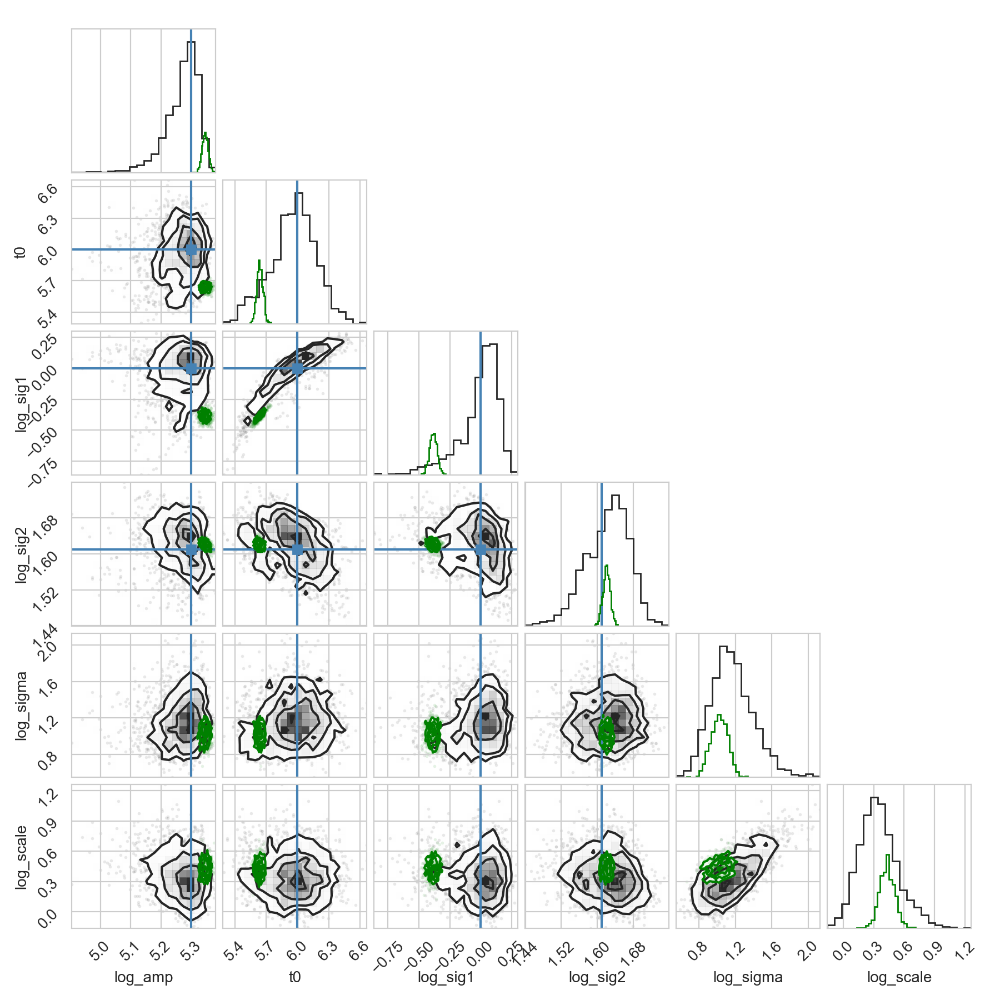

In [83]:
var_names = ["log_amp", "t0", "log_sig1", "log_sig2", "log_sigma", "log_scale"]
true_params = {"log_sigma": jnp.log(true_sigma), "log_scale": jnp.log(true_scale),
               "log_amp" : jnp.log(skew_amp), "t0": skew_t0, "log_sig1": jnp.log(skew_sig1),
               "log_sig2": jnp.log(skew_sig2)}

samples_pars = np.array([svi_samples[vn] for vn in var_names]).T
mcmc_samples_pars = np.array([mcmc_samples[vn] for vn in var_names]).T
true_params_list = np.array([true_params[vn] for vn in var_names])


fig = plt.figure(figsize=(9, 9))
corner.corner(mcmc_samples_pars, truths=true_params_list, labels=var_names, fig=fig, titles="MCMC");
corner.corner(samples_pars, fig=fig, color="green");

Can we draw examples from the posterior? What do they look like?

In [84]:
def sample_lc_from_posterior(params, time, key=None, exp_const=3):
    """
    Sample light curves from the MCMC posterior we've inferred above.
    This helps us explore whether samples from the posterior look 
    anything like the data. This function uses the model where 
    we combine a skew-Gaussian mean function with the exponential of a
    Gaussian Process realization with a Matern 3/2 kernel. The 
    mean of the GP is set by the `exp_const` variable, which is 
    currently fixed and not part of the model.
    
    Parameters
    ----------
    params : numpy.ndarray or JAX array
        A list of parameters for the model. Parameters are:
            * 'log_amp': log-amplitude of the skew-Gaussian
            * 't0': peak time of the skew-Gaussian
            * 'log_sig1': log rise timescale of the skew-Gaussian
            * 'log_sig2': log fall timescale of the skew-Gaussian
            * 'log_sigma': log-amplitude of the Matern 3/2 kernel
            * 'log_scale': log-timescale for the Matern 3/2 kernel
            
    time : numpy.ndarray or JAX array
        Array of time stamps for which to evaluate the model
        
    key : int, default None
        If `None`, randomly set the seed for the realization, otherwise
        use the number provided. Can be fixed for reproducibility.
        
    exp_const : float, default 3
        The constant to add as a mean function to the GP. Avoids the 
        exponential of the GP amounting to isolated peaks with stretches 
        of no flux in between.

    Returns
    -------
    lcsim : stingray.Lightcurve object
        The simulated light curve
        
    pssim : stingray.Powerspectrum object
        The periodogram of the simulated light curve
    """
    
    var_names = ["log_amp", "t0", "log_sig1", "log_sig2", "log_sigma", "log_scale"]

    # get params for skew_gaussian and calculate the mean
    mean_params = params[:4]
    mean_val = skewgaussian(time, mean_params)

    # get kernel parameters and compute GP realiation
    kernel_params = jnp.exp(params[4:])
    
    kernel = kernels.quasisep.Matern32(scale=kernel_params[1], sigma=kernel_params[0])

    # compute array of constant GP mean function:
    gp_mean = jnp.zeros_like(time) + exp_const
    
    # GP with constant function to generate random process
    gp = GaussianProcess(kernel, time, mean_value=gp_mean, diag=0.01)
    
    if key is None:
        key = random.PRNGKey(np.random.randint(0,1e7))
    else:
        key = random.PRNGKey(key)

    # sample light curve from GP
    gp_sample = gp.sample(key)

    # calculate flux
    exp_gp = jnp.exp(gp_sample) # exponentiated GP
    flux = exp_gp + mean_val 
    counts = np.random.poisson(flux)

    lcsim = Lightcurve(time, counts, dt=time[1]-time[0], skip_checks=True)
    pssim = Powerspectrum(lcsim, norm="frac")
    return lcsim, pssim

Let's simulate five light curves and look at them, compared to the input light curve:

<IPython.core.display.Javascript object>


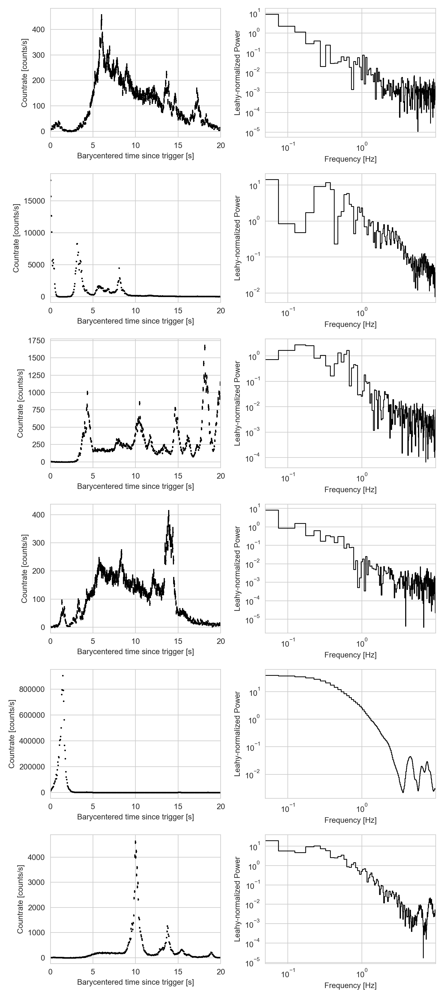

In [87]:
nsamples = mcmc_samples["t0"].shape[0]
nsim = 5
idx = np.random.choice(np.arange(0, nsamples, 1, dtype=int), size=nsim)

lcsim_all, pssim_all = [], []
for i in idx:
    lcsim, pssim = sample_lc_from_posterior(mcmc_samples_pars[i, :], lcsample.time)
    lcsim_all.append(lcsim)
    pssim_all.append(pssim)
    
fig, axes = plt.subplots(nsim+1, 2, figsize=(8,(nsim+1)*3))

axes = np.hstack(axes)

axes[0].errorbar(lcsample.time, lcsample.counts, yerr=np.sqrt(np.abs(lcsample.counts)), 
             fmt="o", markersize=1, color="black")
#ax1.plot(time, mean_val, lw=2, color="green")

axes[0].set_xlim(lcsample.time[0], lcsample.time[-1])
axes[0].set_xlabel("Barycentered time since trigger [s]")
axes[0].set_ylabel("Countrate [counts/s]")

axes[1].loglog(pssample.freq, pssample.power, ds="steps-mid", lw=1, color="black")
axes[1].set_xlim(pssample.freq[0], pssample.freq[-1])
axes[1].set_xlabel("Frequency [Hz]")
axes[1].set_ylabel("Leahy-normalized Power")


for i, (lcsim, pssim) in enumerate(zip(lcsim_all, pssim_all)):
    axes[(i+1)*2].errorbar(lcsim.time, lcsim.counts, yerr=np.sqrt(np.abs(lcsim.counts)), 
                 fmt="o", markersize=1, color="black")
    #ax1.plot(time, mean_val, lw=2, color="green")

    axes[(i+1)*2].set_xlim(lcsample.time[0], lcsample.time[-1])
    axes[(i+1)*2].set_xlabel("Barycentered time since trigger [s]")
    axes[(i+1)*2].set_ylabel("Countrate [counts/s]")

    axes[(i+1)*2+1].loglog(pssim.freq, pssim.power, ds="steps-mid", lw=1, color="black")
    axes[(i+1)*2+1].set_xlim(pssample.freq[0], pssample.freq[-1])
    axes[(i+1)*2+1].set_xlabel("Frequency [Hz]")
    axes[(i+1)*2+1].set_ylabel("Leahy-normalized Power")
    
fig.tight_layout()

Okay, that looks pretty realistic, but there are a lot of big spikes that don't always look super realistic.

### Multiplicative mean model

There are certainly examples of bursts where there seems to be a relationship between the overall brightness and the amplitude of the variability (e.g. GRB 230307A). Let's implement this as a multiplicative model: the light curve is the product of the skew-Gaussian mean function and the exponentiated Gaussian Process:

INFO[2024-03-29 12:15:54,386]: Checking if light curve is well behaved. This can take time, so if you are sure it is already sorted, specify skip_checks=True at light curve creation.
INFO[2024-03-29 12:15:54,387]: Checking if light curve is sorted.
INFO[2024-03-29 12:15:54,387]: Computing the bin time ``dt``. This can take time. If you know the bin time, please specify it at light curve creation


<IPython.core.display.Javascript object>


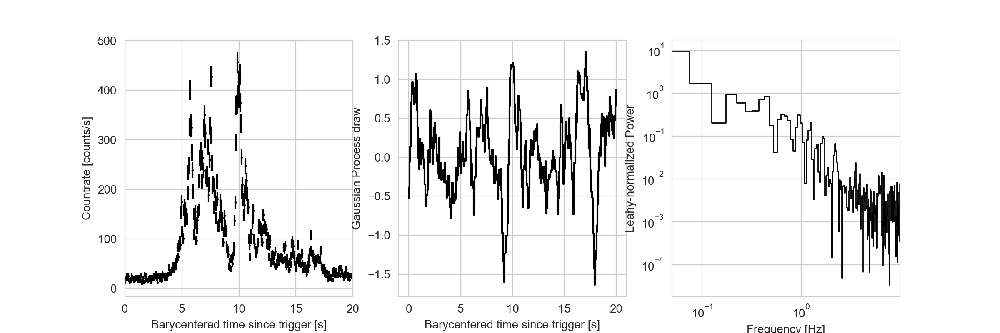

Text(0, 0.5, 'Leahy-normalized Power')

In [90]:
# Make a time array
dt = 0.05
tseg = 20.0
time = np.linspace(0, tseg, int(tseg/dt))


# make the kernel and set up GP
true_log_sigma = jnp.log(0.5)
true_log_scale = jnp.log(0.3)

kernel_params_true = {"log_sigma": true_log_sigma,
                      "log_scale": true_log_scale}

kernel = kernels.quasisep.Matern32(
    scale=jnp.exp(true_log_scale), sigma=jnp.exp(true_log_sigma)
)

gp = GaussianProcess(kernel, time, diag=0.01)

key = random.PRNGKey(500)
gp_sample = gp.sample(key)

###########################

# set up the mean function
true_log_amp = jnp.log(100)
true_t0 = 6.0
true_log_sig1 = jnp.log(1.0)
true_log_sig2 = jnp.log(5.0)

mean_params_true = [true_log_amp, true_t0, true_log_sig1, true_log_sig2]
mean_val = skewgaussian(time, mean_params_true)

# parameter to set the absolute level of the GP mean
true_log_const = jnp.log(0.5)

# background flux
true_log_bkg = jnp.log(20.0)

############################

# combine light curve
gp_flux = jnp.exp(gp_sample + jnp.exp(true_log_const))
flux = mean_val * gp_flux + jnp.exp(true_log_bkg)
counts = np.random.poisson(flux)

lcsample = Lightcurve(time, counts)
pssample = Powerspectrum(lcsample, norm="frac")

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12,4))

ax1.errorbar(lcsample.time, lcsample.counts, yerr=np.sqrt(np.abs(lcsample.counts)), 
             fmt="o", markersize=1, color="black")
#ax1.plot(time, mean_val, lw=2, color="green")

ax1.set_xlim(lcsample.time[0], lcsample.time[-1])
ax1.set_xlabel("Barycentered time since trigger [s]")
ax1.set_ylabel("Countrate [counts/s]")

ax2.plot(lcsample.time, gp_sample, color="black", ds="steps-mid")
ax2.set_xlabel("Barycentered time since trigger [s]")
ax2.set_ylabel("Gaussian Process draw")

ax3.loglog(pssample.freq, pssample.power, ds="steps-mid", lw=1, color="black")
#ax2.loglog(pssample.freq, ps_carma, lw=1, color="purple")
ax3.set_xlim(pssample.freq[0], pssample.freq[-1])
ax3.set_xlabel("Frequency [Hz]")
ax3.set_ylabel("Leahy-normalized Power")



Okay, let's see if I can sample this model. I have an additional parameter, which is the fraction of the overall rise and fall that attenuates the noise process. This also has the slight effect that the model flux can go negative, but let's worry about that later:

In [107]:
def mult_model(x, y=None):
    """
    This model defines a skew-Gaussian function that parameterizes the 
    overall rise and fall of a burst, and a Gaussian Process with a 
    Matern 3/2 kernel and a constant mean function. The light curve is 
    modelled as the product of the two, with Poisson errors. 
    
    The log-rates modelled by the GP are considered latent variables 
    that we integrate over. 

    Parameters
    ----------
    x : jax.numpy.array
        The x-coordinate of the data (usually here time)
        
    y : jax.numpy.array
        The y-coordinate of the data (usually here photon counts)
    
    """
 
    # mean parameters
    log_amp = numpyro.sample('log_amp', dist.Uniform(3, 8))
    t0 = numpyro.sample("t0", dist.Uniform(2, 10))
    log_sig1 = numpyro.sample("log_sig1", dist.Uniform(-1, 1.5))
    log_sig2 = numpyro.sample("log_sig2", dist.Uniform(0, 3))

    mean_params = [log_amp, t0, log_sig1, log_sig2]
    
    mean_val = skewgaussian(x, mean_params)
    

    # The parameters of the GP model    
    log_scale = numpyro.sample("log_scale", dist.Uniform(-2, 10))
    log_sigma = numpyro.sample("log_sigma", dist.Uniform(-6, 4))

    # constant offset from zero for GP
    log_const = numpyro.sample("log_const", dist.Uniform(-6, jnp.log(3.0)))
    #gp_mean = jnp.zeros_like(x) + jnp.exp(log_const)
    
    # constant background flux
    log_bkg = numpyro.sample("log_bkg", dist.Uniform(-4, jnp.log(200)))
    
    # Set up the kernel and GP objects
    
    kernel = kernels.quasisep.Matern32(
        scale=jnp.exp(log_scale), sigma=jnp.exp(log_sigma)
    )

    gp = GaussianProcess(kernel, x, diag=0.01)

    # This parameter has shape (num_data,) and it encodes our beliefs about
    # the process rate in each bin
    log_rate = numpyro.sample("log_rate", gp.numpyro_dist())
    
    gp_flux = jnp.exp(log_rate + jnp.exp(log_const))
    flux =  mean_val * gp_flux + jnp.exp(log_bkg)

    # Finally, our observation model is Poisson
    numpyro.sample("obs", dist.Poisson(flux), obs=y)


In [108]:
timer_start = tsys.time()

## MCMC 
nuts_kernel = numpyro.infer.NUTS(mult_model, target_accept_prob=0.9)
mcmc = numpyro.infer.MCMC(
    nuts_kernel,
    num_warmup=3000,
    num_samples=1000,
    num_chains=2,
    progress_bar=True,
)
rng_key = jax.random.PRNGKey(55683)
mcmc.run(rng_key, lcsample.time, y=lcsample.counts)
mcmc_samples = mcmc.get_samples()

timer_end = tsys.time()
print(f"Total run time: {timer_end - timer_start}")

sample: 100%|█| 4000/4000 [04:32<00:00, 14.65it/s, 1023 steps of size 8.69e-03. 
sample: 100%|█| 4000/4000 [05:52<00:00, 11.36it/s, 1023 steps of size 7.49e-03. 

Total run time: 626.3927240371704


<IPython.core.display.Javascript object>


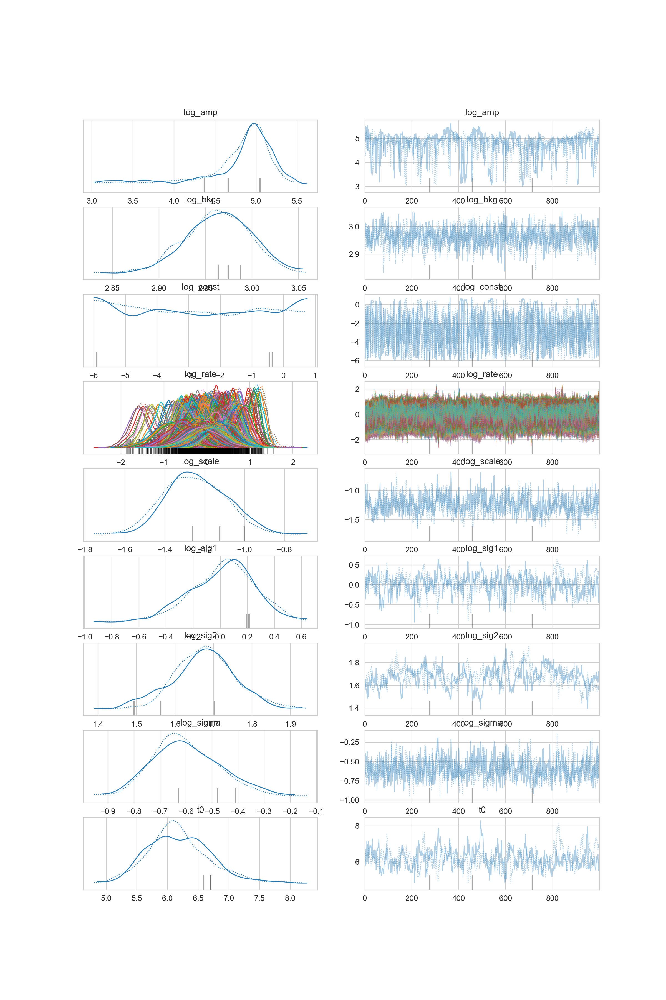

In [109]:
mcmc_data = az.from_numpyro(mcmc)
az.plot_trace(mcmc_data);

Now SVI:

In [112]:
init_values = {"log_amp": 5.0, "t0":5.0, "log_sig1":0.0, "log_sig2": 2.0,
               "log_sigma": -4.0, "log_scale":0.5, "log_const": jnp.log(0.5), "log_bkg": jnp.log(20.0)}

In [113]:
timer_start = tsys.time()

# SVI
nsteps = 2000
optim = numpyro.optim.Adam(0.002)
#guide = autoguide.AutoDAIS(mult_model, init_loc_fn=init_to_value(values=init_values))
guide = autoguide.AutoMultivariateNormal(mult_model)
svi = numpyro.infer.SVI(mult_model, guide, optim, numpyro.infer.Trace_ELBO(10))
results = svi.run(jax.random.PRNGKey(53333), nsteps, lcsample.time, y=lcsample.counts, progress_bar=True)

svi_samples = guide.sample_posterior(key, results.params, sample_shape=(1000,))

timer_end = tsys.time()
print(f"Total run time: {timer_end - timer_start}")

100%|█| 2000/2000 [00:21<00:00, 92.42it/s, init loss: 41977.8161, avg. loss [190


Total run time: 22.575548887252808


SVI Loss Plot:

<IPython.core.display.Javascript object>


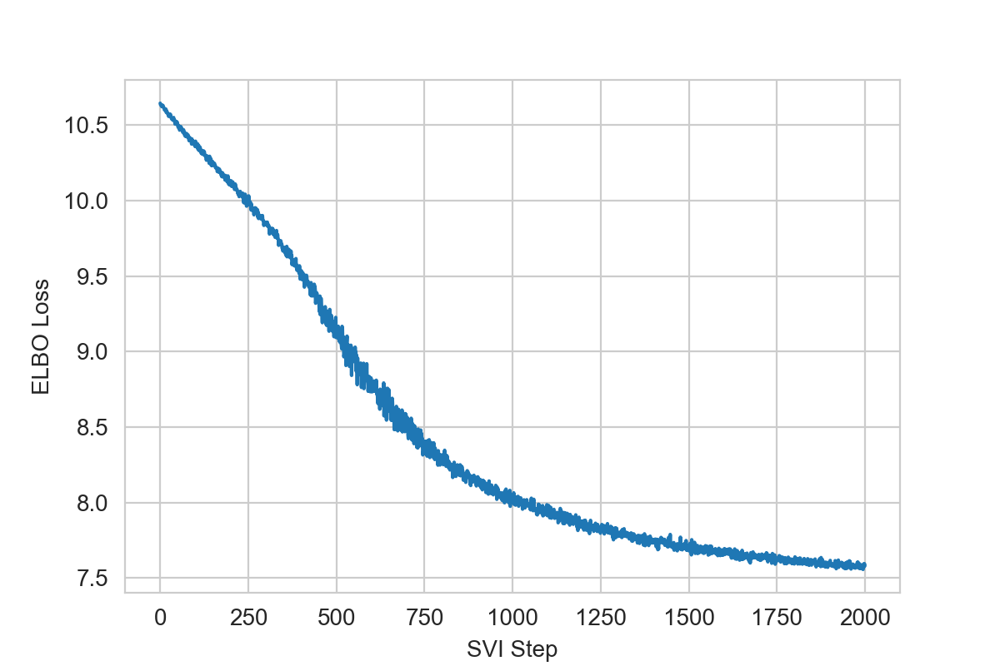

Text(0, 0.5, 'ELBO Loss')

In [114]:
fig, ax = plt.subplots(1, 1, figsize=(6,4))
ax.plot(np.arange(nsteps), np.log(results.losses))
ax.set_xlabel("SVI Step")
ax.set_ylabel("ELBO Loss")

What do the results look like?

In [115]:
mcmc_skew_params = np.array([mcmc_samples["log_amp"], mcmc_samples["t0"], 
                    mcmc_samples["log_sig1"], mcmc_samples["log_sig2"]]).T

mcmc_mean = []
for p in mcmc_skew_params:
    mcmc_mean.append(skewgaussian(lcsample.time,p))

mcmc_mean = np.array(mcmc_mean)



svi_skew_params = np.array([svi_samples["log_amp"], svi_samples["t0"], 
                  svi_samples["log_sig1"], svi_samples["log_sig2"]]).T

svi_mean = []
for p in svi_skew_params:
    svi_mean.append(skewgaussian(lcsample.time, p))

svi_mean = np.array(svi_mean)

<IPython.core.display.Javascript object>


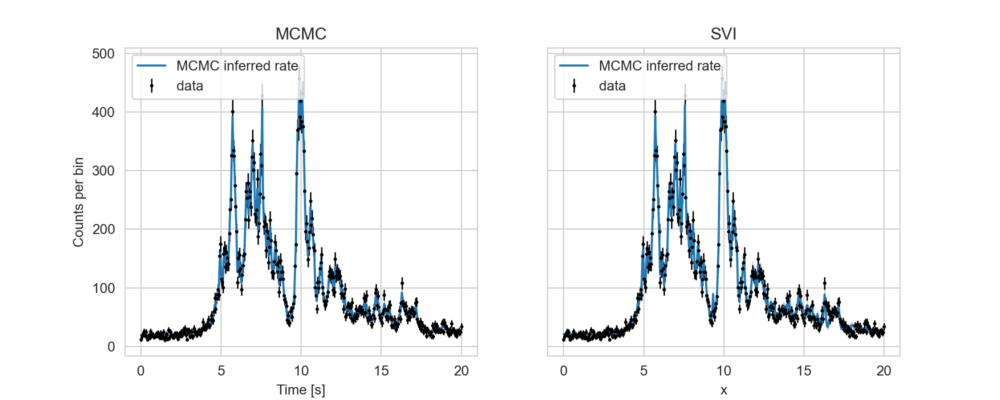

Text(0.5, 1.0, 'SVI')

In [116]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), sharey=True, sharex=True)


    
mcmc_flux = mcmc_mean.T * jnp.exp(mcmc_samples["log_rate"].T + \
                                  jnp.exp(mcmc_samples["log_const"])) + \
            jnp.exp(mcmc_samples["log_bkg"])

q = np.percentile(mcmc_flux.T, [5, 25, 50, 75, 95], axis=0)
ax1.errorbar(lcsample.time, lcsample.counts, yerr=np.sqrt(lcsample.counts),
             fmt="o", markersize=1.5, lw=1, color="black", label="data")

ax1.plot(lcsample.time, q[2] , color="C0", label="MCMC inferred rate")
ax1.fill_between(lcsample.time, q[0], q[-1], alpha=0.3, lw=0, color="C0")
ax1.fill_between(lcsample.time, q[1], q[-2], alpha=0.3, lw=0, color="C0")

ax1.legend(loc=2)
ax1.set_xlabel("Time [s]")
ax1.set_ylabel("Counts per bin")
ax1.set_title("MCMC")



svi_flux = svi_mean.T * jnp.exp(svi_samples["log_rate"].T + \
                                jnp.exp(svi_samples["log_const"])) + \
           jnp.exp(svi_samples["log_bkg"])
q_svi = np.percentile(svi_flux.T, [5, 25, 50, 75, 95], axis=0)

ax2.errorbar(lcsample.time, lcsample.counts, yerr=np.sqrt(lcsample.counts),
             fmt="o", markersize=1.5, lw=1, color="black", label="data")

ax2.plot(lcsample.time, q_svi[2] , color="C0", label="MCMC inferred rate")
ax2.fill_between(lcsample.time, q_svi[0], q_svi[-1], alpha=0.3, lw=0, color="C0")
ax2.fill_between(lcsample.time, q_svi[1], q_svi[-2], alpha=0.3, lw=0, color="C0")


ax2.legend(loc=2)
ax2.set_xlabel("x")
ax2.set_title("SVI")


What do the posterior distributions look like?

In [117]:
true_log_sigma

Array(-0.69314718, dtype=float64, weak_type=True)

<IPython.core.display.Javascript object>


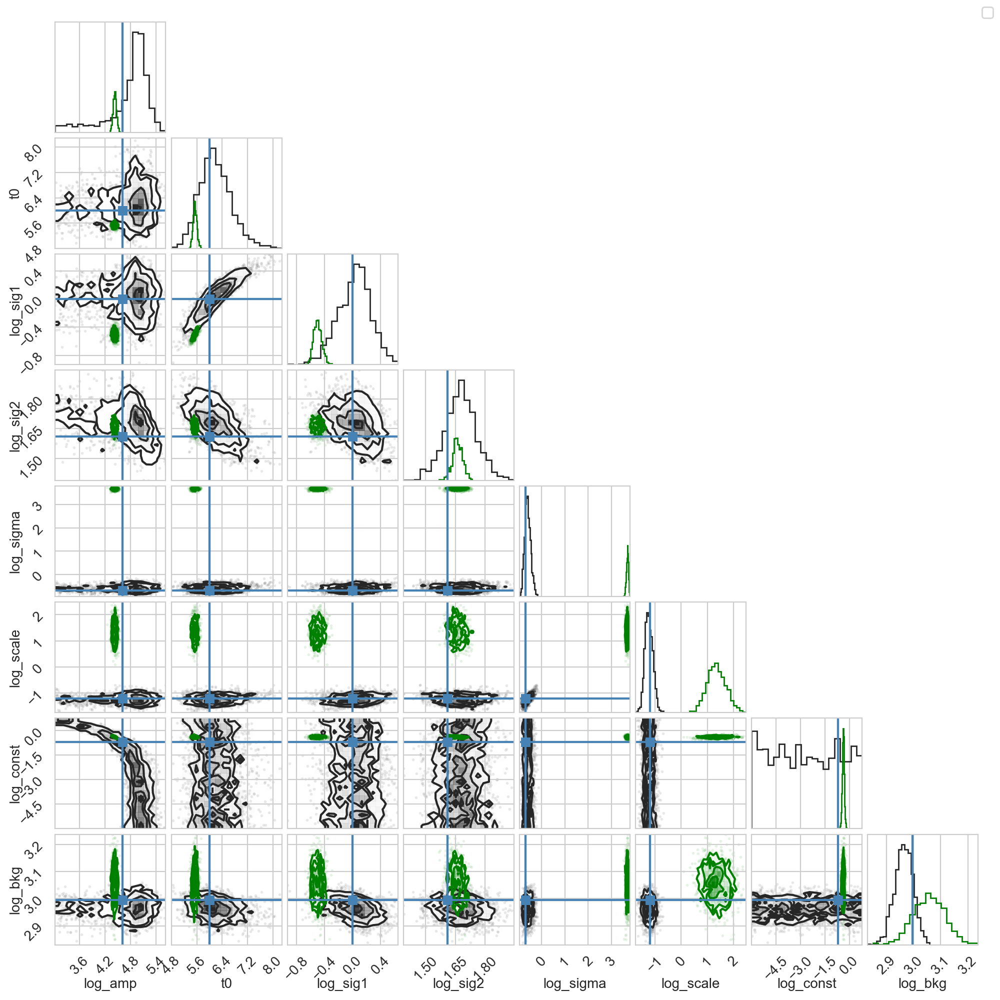

WARNING[2024-03-29 14:01:46,071]: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [118]:
#var_names = ["log_amp", "t0", "log_sig1", "log_sig2", "log_sigma", "log_scale", 
#             "log_const", "frac"]

#true_params = {"log_sigma": true_log_sigma, "log_scale": true_log_scale,
#               "log_amp" : true_log_amp, "t0": true_t0, "log_sig1": true_log_sig1,
#               "log_sig2": true_log_sig2, "frac": true_frac, "log_const": true_log_const}

var_names = ["log_amp", "t0", "log_sig1", "log_sig2", 
             "log_sigma", "log_scale", "log_const", "log_bkg"]

true_params = {"log_sigma": true_log_sigma, "log_scale": true_log_scale,
               "log_amp" : true_log_amp, "t0": true_t0, "log_sig1": true_log_sig1,
               "log_sig2": true_log_sig2, "log_const": true_log_const, "log_bkg": true_log_bkg}



samples_pars = np.array([svi_samples[vn] for vn in var_names]).T
mcmc_samples_pars = np.array([mcmc_samples[vn] for vn in var_names]).T
true_params_list = np.array([true_params[vn] for vn in var_names])


fig = plt.figure(figsize=(10, 10))
corner.corner(mcmc_samples_pars, truths=true_params_list, labels=var_names, fig=fig, titles="MCMC");
corner.corner(samples_pars, truths=true_params_list, labels=var_names, fig=fig, titles="SVI", color="green");

fig.legend()

Well, that works great! Let's draw some samples:

In [119]:
def sample_lc_from_mult_posterior(params, time, key=None, exp_const=3):
    
    var_names = ["log_amp", "t0", "log_sig1", "log_sig2", 
                 "log_sigma", "log_scale", "log_const", "log_bkg"]

    mean_params = params[:4]
    kernel_params = jnp.exp(params[4:6])
    log_const = params[6]
    log_bkg = params[7]
    
    kernel = kernels.quasisep.Matern32(scale=kernel_params[1], sigma=kernel_params[0])

    # GP without the mean function to generate random process
    gp = GaussianProcess(kernel, time, diag=0.01)
    
    if key is None:
        key = random.PRNGKey(np.random.randint(0,1e7))
    else:
        key = random.PRNGKey(key)
        
    gp_sample = gp.sample(key)

    mean_val = skewgaussian(time, mean_params)

    # calculate flux
    gp_flux = jnp.exp(gp_sample + jnp.exp(log_const))
    flux = mean_val * gp_flux + jnp.exp(log_bkg)
    counts = np.random.poisson(flux)

    lcsim = Lightcurve(time, counts, dt=time[1]-time[0], skip_checks=True)
    pssim = Powerspectrum(lcsim, norm="frac")
    return lcsim, pssim

<IPython.core.display.Javascript object>


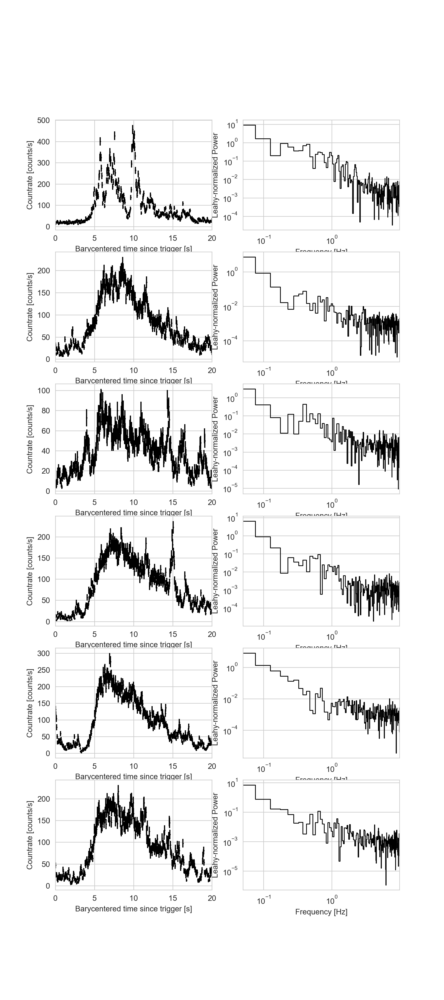

In [120]:
nsamples = mcmc_samples["t0"].shape[0]
nsim = 5
idx = np.random.choice(np.arange(0, nsamples, 1, dtype=int), size=nsim)

lcsim_all, pssim_all = [], []
for i in idx:
    lcsim, pssim = sample_lc_from_posterior(mcmc_samples_pars[i, :], lcsample.time)
    lcsim_all.append(lcsim)
    pssim_all.append(pssim)
    
fig, axes = plt.subplots(nsim+1, 2, figsize=(8,(nsim+1)*3))

axes = np.hstack(axes)

axes[0].errorbar(lcsample.time, lcsample.counts, yerr=np.sqrt(np.abs(lcsample.counts)), 
             fmt="o", markersize=1, color="black")
#ax1.plot(time, mean_val, lw=2, color="green")

axes[0].set_xlim(lcsample.time[0], lcsample.time[-1])
axes[0].set_xlabel("Barycentered time since trigger [s]")
axes[0].set_ylabel("Countrate [counts/s]")

axes[1].loglog(pssample.freq, pssample.power, ds="steps-mid", lw=1, color="black")
axes[1].set_xlim(pssample.freq[0], pssample.freq[-1])
axes[1].set_xlabel("Frequency [Hz]")
axes[1].set_ylabel("Leahy-normalized Power")


for i, (lcsim, pssim) in enumerate(zip(lcsim_all, pssim_all)):
    axes[(i+1)*2].errorbar(lcsim.time, lcsim.counts, yerr=np.sqrt(np.abs(lcsim.counts)), 
                 fmt="o", markersize=1, color="black")
    #ax1.plot(time, mean_val, lw=2, color="green")

    axes[(i+1)*2].set_xlim(lcsample.time[0], lcsample.time[-1])
    axes[(i+1)*2].set_xlabel("Barycentered time since trigger [s]")
    axes[(i+1)*2].set_ylabel("Countrate [counts/s]")

    axes[(i+1)*2+1].loglog(pssim.freq, pssim.power, ds="steps-mid", lw=1, color="black")
    axes[(i+1)*2+1].set_xlim(pssample.freq[0], pssample.freq[-1])
    axes[(i+1)*2+1].set_xlabel("Frequency [Hz]")
    axes[(i+1)*2+1].set_ylabel("Leahy-normalized Power")


## Application to GRB 230307A

Let's now apply this model to the GRB, then simulate data from the MAP model and see if I can recover the parameters.

## Running this on the real data

To load the data, we'll have to read them from an IDL .sav file, which will return a dictionary with the relevant columns as keywords and the values in arrays:

In [48]:
#datadir = "/Users/danielahuppenkothen/work/repositories/grb230307a_qposearch/data/"
datadir = "/Users/daniela/work/data/grb230307A/"

data = scipy.io.readsav(datadir+"acs_lc_bary.sav")
data

{'barytime': array([-6.87185967, -6.82185948, -6.77185976, ..., 98.02814186,
        98.07813728, 98.12814033], dtype='>f8'),
 'counts': array([4502., 4570., 4576., ..., 4516., 4444., 4514.], dtype='>f4')}

Let's turn this into a `stingray.Lightcurve` object. On the way, we will also restrict it to the 0-60s time interval, and will take out the background:

In [82]:
barytime = np.array(data["barytime"], dtype=float)
counts = np.array(data["counts"], dtype=float)


# store in Lightcurve object, then truncate to 0-60s interval:
lc = Lightcurve(barytime, counts)
#minind = lc.time.searchsorted(0.0)
#maxind = lc.time.searchsorted(60.0)
#lc = lc.truncate(start=minind, stop=maxind, method="index")

# calculate periodogram for comparison:
ps = Powerspectrum(lc, norm="leahy")

INFO[2024-03-20 14:04:19,343]: Checking if light curve is well behaved. This can take time, so if you are sure it is already sorted, specify skip_checks=True at light curve creation.
INFO[2024-03-20 14:04:19,345]: Checking if light curve is sorted.
INFO[2024-03-20 14:04:19,347]: Computing the bin time ``dt``. This can take time. If you know the bin time, please specify it at light curve creation


Let's plot the light curve and periodogram:

<IPython.core.display.Javascript object>


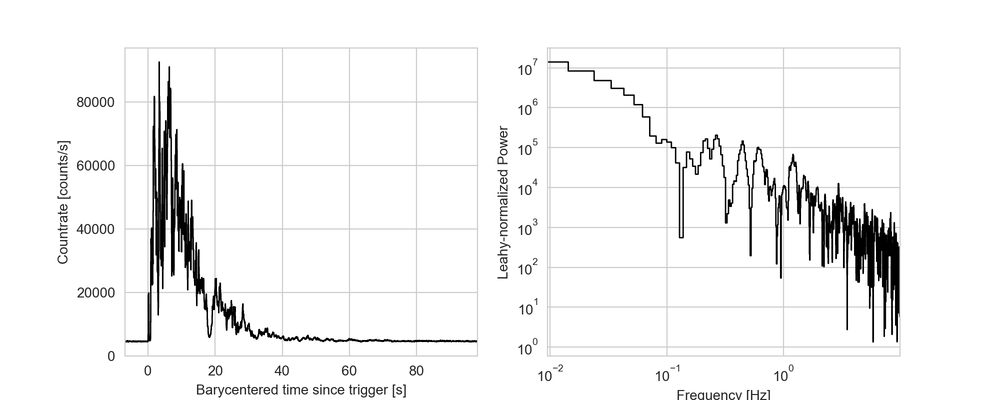

Text(0, 0.5, 'Leahy-normalized Power')

In [83]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4))

ax1.plot(lc.time, lc.counts, lw=1, color="black", ds="steps-mid")
ax1.set_xlim(lc.time[0], lc.time[-1])
ax1.set_xlabel("Barycentered time since trigger [s]")
ax1.set_ylabel("Countrate [counts/s]")

ax2.loglog(ps.freq, ps.power, ds="steps-mid", lw=1, color="black")
ax2.set_xlim(ps.freq[0], ps.freq[-1])
ax2.set_xlabel("Frequency [Hz]")
ax2.set_ylabel("Leahy-normalized Power")

In [84]:
t0_init = 6.0
log_amp_init = np.log(np.max(lc.counts)/2.)
log_sig1_init = np.log(3.0)
log_sig2_init = np.log(20.0)
log_const_init = np.log(np.mean(lc.counts[-200:]))
frac_init = 0.1

log_sigma_init = 0.0
log_scale_init = -2.0

In [85]:
def mult_model_grb(x, y=None):
    """
    A model that defines a Damped Random Walk Gaussian Process and 
    a skew-normal mean function. The combined process includes the 
    addition of the mean function, and the DRW * frac * mean_function, 
    where frac is between 0.0 and 0.5. We also include a constant, 
    additive background to simulate sky background and use a 
    Poisson likelihood.

    Parameters
    ----------
    x : jax.numpy.array
        The x-coordinate of the data (usually here time)
        
    y : jax.numpy.array
        The y-coordinate of the data (usually here photon counts)
    
    """
 
    # mean parameters
    log_amp = numpyro.sample('log_amp', dist.Uniform(4, 12))
    t0 = numpyro.sample("t0", dist.Uniform(0.0, 15))
    log_sig1 = numpyro.sample("log_sig1", dist.Uniform(-2, 2.3))
    log_sig2 = numpyro.sample("log_sig2", dist.Uniform(2.0, 5.0))
    log_const = numpyro.sample("log_const", dist.Normal(8.5, 1.0))

    mean_params = [log_amp, t0, log_sig1, log_sig2]
    
    mean_val = skewgaussian(x, mean_params)
    

    # The parameters of the GP model    
    log_scale = numpyro.sample("log_scale", dist.Uniform(-10, 10))
    log_sigma = numpyro.sample("log_sigma", dist.Uniform(-10, 10))
    frac = numpyro.sample("frac", dist.Uniform(0.0, 1.0))
    
    #print(alpha1)
    # Set up the kernel and GP objects
    
    kernel = kernels.quasisep.Exp(
        scale=jnp.exp(log_scale), sigma=jnp.exp(log_sigma)
    )

    gp = GaussianProcess(kernel, x, diag=0.01)

    # This parameter has shape (num_data,) and it encodes our beliefs about
    # the process rate in each bin
    log_rate = numpyro.sample("log_rate", gp.numpyro_dist())
    
    flux =  mean_val + frac * mean_val * log_rate + jnp.exp(log_const)

    # Finally, our observation model is Poisson
    numpyro.sample("obs", dist.Poisson(flux), obs=y)


In [86]:
## MCMC 
nuts_kernel = numpyro.infer.NUTS(mult_model_grb, target_accept_prob=0.9)
mcmc = numpyro.infer.MCMC(
    nuts_kernel,
    num_warmup=2000,
    num_samples=1000,
    num_chains=4,
    progress_bar=True,
)
rng_key = jax.random.PRNGKey(53993)
mcmc.run(rng_key, lc.time, y=lc.counts)
mcmc_samples = mcmc.get_samples()


sample: 100%|█| 3000/3000 [13:49<00:00,  3.62it/s, 1023 steps of size 1.06e-03
sample: 100%|█| 3000/3000 [13:28<00:00,  3.71it/s, 1023 steps of size 1.28e-03
sample: 100%|█| 3000/3000 [13:59<00:00,  3.57it/s, 1023 steps of size 2.99e-03
sample: 100%|█| 3000/3000 [08:37<00:00,  5.80it/s, 511 steps of size 7.15e-03.


<IPython.core.display.Javascript object>


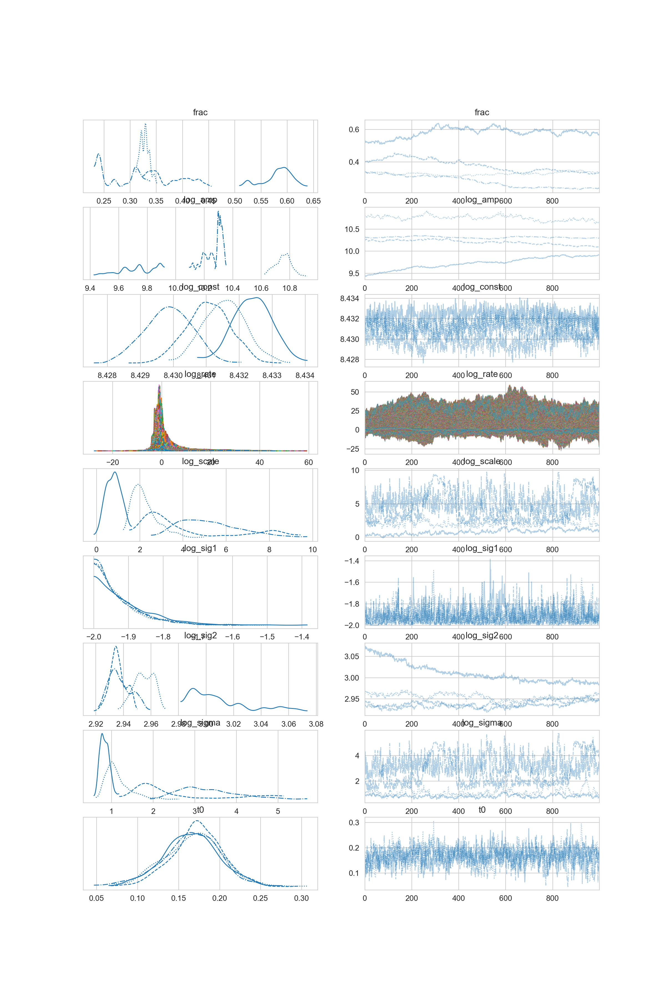

In [87]:
mcmc_data = az.from_numpyro(mcmc)
az.plot_trace(mcmc_data, compact=True);

What about SVI?

In [55]:
t0_init = 6.0
log_amp_init = np.log(np.max(lc.counts)/2.)
log_sig1_init = np.log(3.0)
log_sig2_init = np.log(20.0)
log_const_init = np.log(np.mean(lc.counts[-200:]))
frac_init = 0.1

log_sigma_init = 0.0
log_scale_init = -2.0

In [56]:
init_values = {"log_amp": 5.0, "t0":5.0, "log_sig1":0.0, "log_sig2": 2.0,
               "log_sigma": -4.0, "log_scale":0.5, "frac": 0.1, "log_const": 2.0}
# SVI
nsteps = 35000
key = 54974

optim = numpyro.optim.Adam(0.0005)
guide = autoguide.AutoDAIS(mult_model, init_loc_fn=init_to_value(values=init_values))
svi = numpyro.infer.SVI(mult_model_grb, guide, optim, numpyro.infer.Trace_ELBO(10))
results = svi.run(jax.random.PRNGKey(key), nsteps, lc.time, y=lc.counts, progress_bar=True)


100%|█| 35000/35000 [1:22:33<00:00,  7.07it/s, init loss: nan, avg. loss [3325


In [62]:
rng_key = jax.random.PRNGKey(53983)

svi_samples = guide.sample_posterior(rng_key, results.params, sample_shape=(1000,))

In [64]:
results.losses

Array([nan, nan, nan, ..., nan, nan, nan], dtype=float64)

<IPython.core.display.Javascript object>


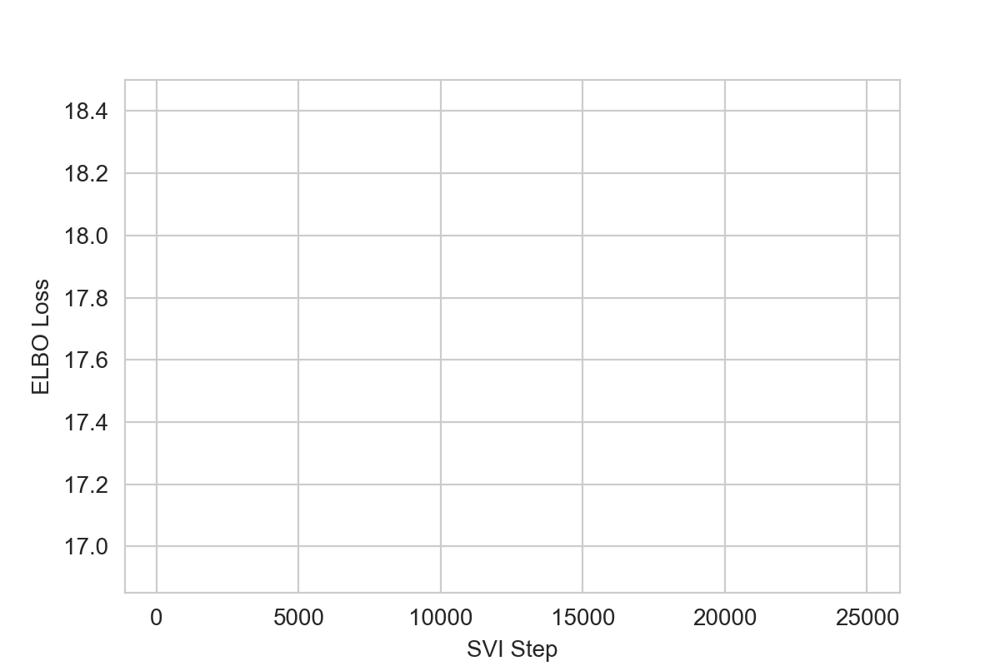

Text(0, 0.5, 'ELBO Loss')

In [63]:
fig, ax = plt.subplots(1, 1, figsize=(6,4))
ax.plot(np.arange(nsteps), np.log(results.losses))
ax.set_xlabel("SVI Step")
ax.set_ylabel("ELBO Loss")

In [88]:
mcmc_skew_params = np.array([mcmc_samples["log_amp"], mcmc_samples["t0"], 
                    mcmc_samples["log_sig1"], mcmc_samples["log_sig2"]]).T

mcmc_mean = []
for p in mcmc_skew_params:
    mcmc_mean.append(skewgaussian(lc.time,p))

mcmc_mean = np.array(mcmc_mean)



#svi_skew_params = np.array([svi_samples["log_amp"], svi_samples["t0"], 
#                  svi_samples["log_sig1"], svi_samples["log_sig2"]]).T

#svi_mean = []
#for p in svi_skew_params:
#    svi_mean.append(skewgaussian(lc.time, p))

#svi_mean = np.array(svi_mean)

<IPython.core.display.Javascript object>


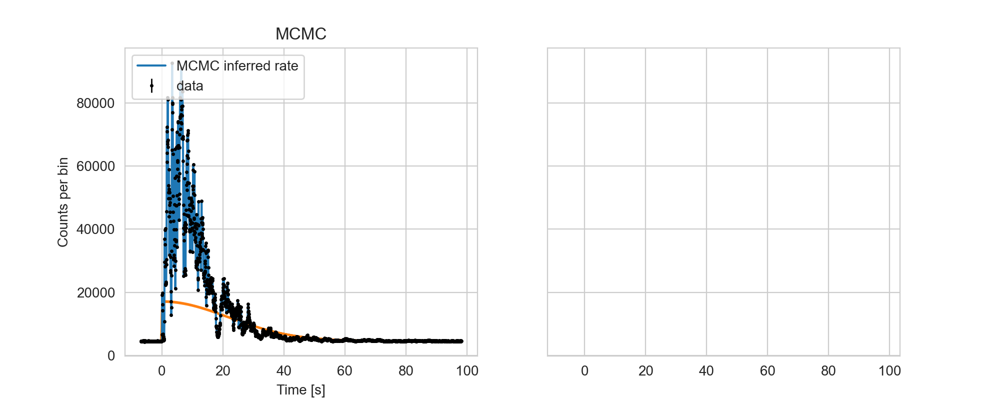

Text(0.5, 1.0, 'MCMC')

In [92]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), sharey=True, sharex=True)

mcmc_flux = mcmc_mean.T \
            + mcmc_samples["frac"] * mcmc_mean.T * mcmc_samples["log_rate"].T \
            + jnp.exp(mcmc_samples["log_const"])

q = np.percentile(mcmc_flux.T, [5, 25, 50, 75, 95], axis=0)
ax1.errorbar(lc.time, lc.counts, yerr=np.sqrt(lc.counts),
             fmt="o", markersize=1.5, lw=1, color="black", label="data")


for i in range(10):
    ax1.plot(lc.time, mcmc_mean[i,:] + jnp.exp(mcmc_samples["log_const"][i]), color="C1", alpha=0.4)

ax1.plot(lc.time, q[2] , color="C0", label="MCMC inferred rate")
ax1.fill_between(lc.time, q[0], q[-1], alpha=0.3, lw=0, color="C0")
ax1.fill_between(lc.time, q[1], q[-2], alpha=0.3, lw=0, color="C0")

ax1.legend(loc=2)
ax1.set_xlabel("Time [s]")
ax1.set_ylabel("Counts per bin")
ax1.set_title("MCMC")



#mu = results.params["auto_z_0_loc"][8:] #results.params["log_rate_auto_loc"]
#sigma = results.params["auto_z_0_scale"][8:] # results.params["log_rate_auto_scale"]
#svi_median_flux = svi_mean + svi_mean * frac_median * mu + jnp.exp(log_const_median)

#svi_flux = svi_mean.T \
#            + svi_mean.T * svi_samples["log_rate"].T \
#            + jnp.exp(svi_samples["log_const"])

#q_svi = np.percentile(svi_flux.T, [5, 25, 50, 75, 95], axis=0)

#ax2.errorbar(lc.time, lc.counts, yerr=np.sqrt(lc.counts),
#             fmt="o", markersize=1.5, lw=1, color="black", label="data")

#ax2.plot(lc.time, q_svi[2] , color="C0", label="MCMC inferred rate")
#ax2.fill_between(lc.time, q_svi[0], q_svi[-1], alpha=0.3, lw=0, color="C0")
#ax2.fill_between(lc.time, q_svi[1], q_svi[-2], alpha=0.3, lw=0, color="C0")


#ax2.legend(loc=2)
#ax2.set_xlabel("x")
#ax2.set_title("SVI")


What do the posterior distributions look like?

<IPython.core.display.Javascript object>


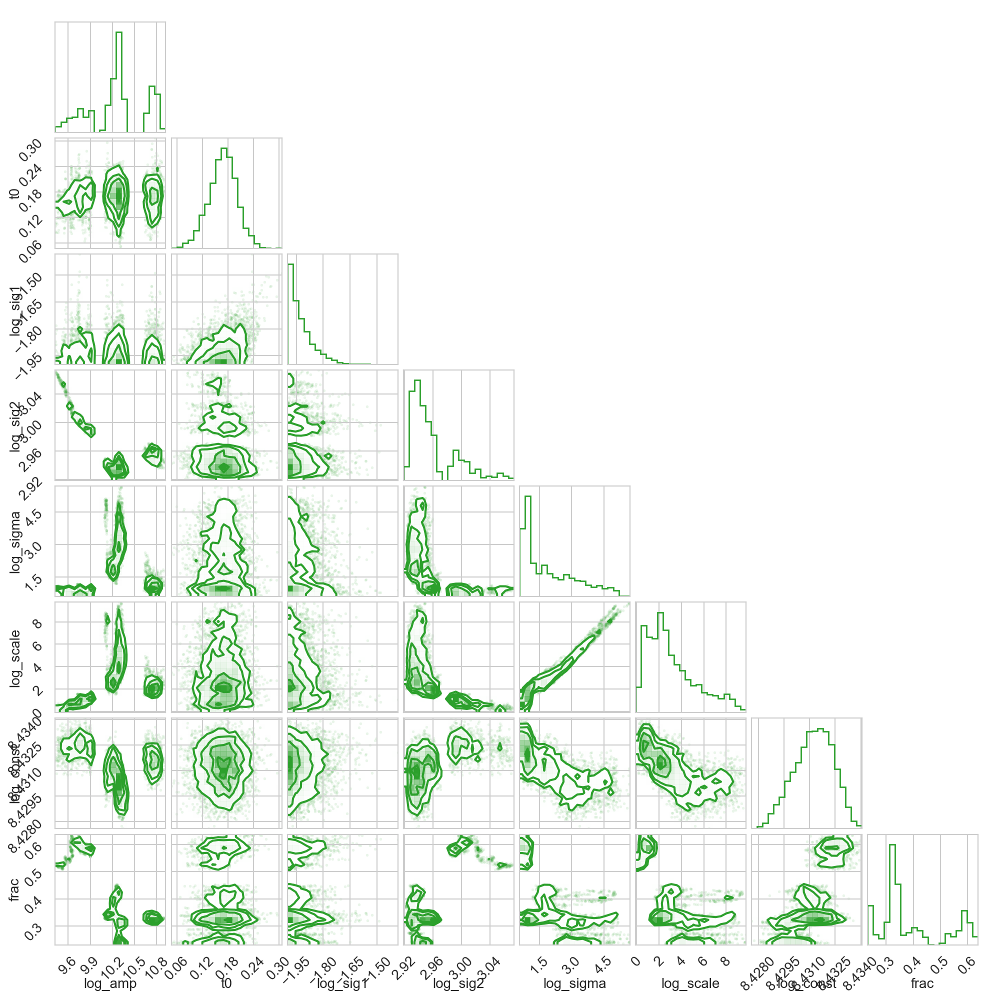

In [93]:
var_names = ["log_amp", "t0", "log_sig1", "log_sig2", "log_sigma", "log_scale", 
             "log_const", "frac"]

#true_params = {"log_sigma": true_log_sigma, "log_scale": true_log_scale,
#               "log_amp" : true_log_amp, "t0": true_t0, "log_sig1": true_log_sig1,
#               "log_sig2": true_log_sig2, "frac": true_frac, "log_const": true_log_const}

#samples_pars = np.array([svi_samples[vn] for vn in var_names]).T
mcmc_samples_pars = np.array([mcmc_samples[vn] for vn in var_names]).T
#true_params_list = np.array([true_params[vn] for vn in var_names])


fig = plt.figure(figsize=(10, 10))
corner.corner(mcmc_samples_pars, labels=var_names, fig=fig, titles="MCMC", color="C2");
#corner.corner(samples_pars, labels=var_names, fig=fig, titles="SVI", color="C1");